In [1]:
# Cell 1 (Fixed)
# =============================================================================
# Load Artifacts, Node Test Datasets, & Concatenate All Predictions
# =============================================================================

import os
import joblib
import numpy as np
import pandas as pd

MODELS_DIR = "models"
BASE_DIR = "dataset/normalized"
AUG_DIR = "dataset/normalized/augmented"
NODES = ["A", "B", "C", "D", "E", "F", "G", "H"]

# -----------------------------------------------------------------------------
# 1. Load Central Label Encoder
# -----------------------------------------------------------------------------
le_base = joblib.load(os.path.join(MODELS_DIR, "label_encoder.joblib"))
classes = le_base.classes_

# -----------------------------------------------------------------------------
# 2. Load Baseline Model & Predict on Pooled Test Sets (Single Binary State)
# -----------------------------------------------------------------------------
rf_base = joblib.load(os.path.join(MODELS_DIR, "rf_final.joblib"))
scaler_base = joblib.load(os.path.join(MODELS_DIR, "scaler.joblib"))

base_numeric_cols = ["shunt_voltage", "bus_voltage_V", "current_mA", "power_mW"]
base_expected_order = ["shunt_voltage", "bus_voltage_V", "current_mA", "power_mW", "State"]

# Load and pool raw node test datasets
test_files = [os.path.join(BASE_DIR, f"Node_{node}_test_normalized.csv") for node in NODES]
df_test_raw = pd.concat([pd.read_csv(p) for p in test_files], ignore_index=True)

# Prepare baseline features with binary State encoding (idle -> 0, charging -> 1)
X_base = df_test_raw[base_expected_order].copy()
if X_base["State"].dtype == object or isinstance(X_base["State"].iloc[0], str):
    state_mapping = {"idle": 0, "charging": 1}
    X_base["State"] = X_base["State"].map(state_mapping).fillna(0).astype(int)

X_base_scaled = X_base.copy()
X_base_scaled[base_numeric_cols] = scaler_base.transform(X_base[base_numeric_cols])
X_base_np = X_base_scaled.to_numpy()

# Generate baseline predictions
y_base_pred_idx = rf_base.predict(X_base_np)
y_base_proba = rf_base.predict_proba(X_base_np)

df_pred_base = pd.DataFrame()
df_pred_base["Attack"] = df_test_raw["Attack"]
df_pred_base["prediction"] = le_base.inverse_transform(y_base_pred_idx)
for idx, cls_name in enumerate(le_base.classes_):
    df_pred_base[f"prob_{cls_name}"] = y_base_proba[:, idx]

df_pred_base.to_csv(os.path.join(MODELS_DIR, "predictions_test_rf_baseline.csv"), index=False)

# -----------------------------------------------------------------------------
# 3. Load Global Context Models & Predict on Augmented Node Test Sets
# -----------------------------------------------------------------------------
rf_m1_global = joblib.load(os.path.join(MODELS_DIR, "global_rf_model1_own_hw_plus_agg_state.joblib"))
scaler_m1 = joblib.load(os.path.join(MODELS_DIR, "global_scaler_model1_state.joblib"))

rf_m2_global = joblib.load(os.path.join(MODELS_DIR, "global_rf_model2_full_context_state.joblib"))
scaler_m2 = joblib.load(os.path.join(MODELS_DIR, "global_scaler_model2_state.joblib"))

# Feature set definitions
original_numeric = ["shunt_voltage", "bus_voltage_V", "current_mA", "power_mW"]
local_features = original_numeric + ["State"]
own_prob_cols = [f"prob_{c}" for c in classes]
agg_numeric = [f"agg_{f}" for f in original_numeric]
agg_prob_cols = [f"agg_prob_{c}" for c in classes]

feature_cols_m1 = local_features + agg_numeric + agg_prob_cols
feature_cols_m2 = local_features + own_prob_cols + agg_numeric + agg_prob_cols

own_cols_m1 = [c for c in feature_cols_m1 if not c.startswith("agg_")]
numeric_own_m1 = [c for c in own_cols_m1 if c in original_numeric]
# ✅ Explicitly include original names AND their '_w2' versions (no duplicates)
numeric_all_m1 = numeric_own_m1 + [f"{c}_w2" for c in numeric_own_m1] + agg_numeric

own_cols_m2 = [c for c in feature_cols_m2 if not c.startswith("agg_")]
numeric_own_m2 = [c for c in own_cols_m2 if c in original_numeric]
# ✅ Explicitly include original names AND their '_w2' versions (no duplicates)
numeric_all_m2 = numeric_own_m2 + [f"{c}_w2" for c in numeric_own_m2] + agg_numeric

df_pred_hw_agg_list = []
df_pred_full_list = []

for node in NODES:
    test_df = joblib.load(os.path.join(AUG_DIR, f"Node_{node}_aug_test.pkl"))
    
    # Ensure binary state mapping
    if test_df["State"].dtype == object or isinstance(test_df["State"].iloc[0], str):
        state_mapping = {"idle": 0, "charging": 1}
        test_df["State"] = test_df["State"].map(state_mapping).fillna(0).astype(int)

    # --- Model 1 Predictions ---
    X_test_m1 = test_df[feature_cols_m1].copy()
    for col in own_cols_m1:
        X_test_m1[f"{col}_w2"] = X_test_m1[col]
    X_test_m1[numeric_all_m1] = scaler_m1.transform(X_test_m1[numeric_all_m1])
    
    prob_m1 = rf_m1_global.predict_proba(X_test_m1.to_numpy())
    pred_m1 = np.argmax(prob_m1, axis=1)
    
    df_p1 = test_df[["Attack"]].copy()
    df_p1["prediction"] = le_base.inverse_transform(pred_m1)
    for idx, cls_name in enumerate(classes):
        df_p1[f"prob_{cls_name}"] = prob_m1[:, idx]
    df_pred_hw_agg_list.append(df_p1)

    # --- Model 2 Predictions ---
    X_test_m2 = test_df[feature_cols_m2].copy()
    for col in own_cols_m2:
        X_test_m2[f"{col}_w2"] = X_test_m2[col]
    X_test_m2[numeric_all_m2] = scaler_m2.transform(X_test_m2[numeric_all_m2])
    
    prob_m2 = rf_m2_global.predict_proba(X_test_m2.to_numpy())
    pred_m2 = np.argmax(prob_m2, axis=1)
    
    df_p2 = test_df[["Attack"]].copy()
    df_p2["prediction"] = le_base.inverse_transform(pred_m2)
    for idx, cls_name in enumerate(classes):
        df_p2[f"prob_{cls_name}"] = prob_m2[:, idx]
    df_pred_full_list.append(df_p2)

df_pred_hw_agg = pd.concat(df_pred_hw_agg_list, ignore_index=True)
df_pred_full   = pd.concat(df_pred_full_list, ignore_index=True)

# -----------------------------------------------------------------------------
# 4. Summary Outputs
# -----------------------------------------------------------------------------
print(f"Loaded label encoder and prediction sets from '{MODELS_DIR}'.")
print(f"Target Attack Classes: {classes}")
print(f"Total Test Samples Evaluated across all {len(NODES)} nodes: {len(df_pred_base)}")
print(f"Model 1 (HW + State + Agg Context) Total Predictions: {len(df_pred_hw_agg)}")
print(f"Model 2 (Full Context + State) Total Predictions:     {len(df_pred_full)}")

Loaded label encoder and prediction sets from 'models'.
Target Attack Classes: ['Backdoor' 'none' 'noneX2' 'syn-flood']
Total Test Samples Evaluated across all 8 nodes: 192000
Model 1 (HW + State + Agg Context) Total Predictions: 192000
Model 2 (Full Context + State) Total Predictions:     192000


In [2]:
# Cell 2
# =============================================================================
# Metric Benchmarking: 3-Model Comparison Summary Table
# =============================================================================

import numpy as np
import pandas as pd
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    log_loss,
    mean_squared_error,
    roc_auc_score,
)

def compute_model_metrics(df_preds, model_name):
    """
    Computes standard evaluation metrics: Accuracy, Macro F1, Weighted F1,
    Mean Squared Error, Multi-class Log Loss, and One-vs-Rest Macro ROC-AUC.
    """
    # Use central label encoder loaded in Cell 1
    y_true_enc = le_base.transform(df_preds["Attack"])
    y_pred_enc = le_base.transform(df_preds["prediction"])
    
    prob_cols = [f"prob_{cls_name}" for cls_name in classes]
    y_proba = df_preds[prob_cols].values
    
    num_classes = len(classes)
    labels_arr = np.arange(num_classes)
    
    acc = accuracy_score(y_true_enc, y_pred_enc)
    macro_f1 = f1_score(y_true_enc, y_pred_enc, average="macro")
    weighted_f1 = f1_score(y_true_enc, y_pred_enc, average="weighted")
    mse_error = mean_squared_error(y_true_enc, y_pred_enc)
    loss = log_loss(y_true_enc, y_proba, labels=labels_arr)
    
    try:
        roc_auc = roc_auc_score(
            y_true_enc, y_proba, multi_class="ovr", average="macro", labels=labels_arr
        )
    except ValueError:
        roc_auc = np.nan
    
    return {
        "Model Configuration": model_name,
        "Accuracy": round(acc, 6),
        "Macro F1": round(macro_f1, 6),
        "Weighted F1": round(weighted_f1, 6),
        "MSE": round(mse_error, 6),
        "Log Loss": round(loss, 6),
        "ROC-AUC (Macro OVR)": round(roc_auc, 6)
    }

# Benchmark Baseline RF against both Context-Aware configurations (all with State)
metrics_summary = [
    compute_model_metrics(df_pred_base, "Baseline RF (Own HW + State)"),
    compute_model_metrics(df_pred_hw_agg, "Model 1: Context RF (Own HW & State [2x] + Agg Context)"),
    compute_model_metrics(df_pred_full, "Model 2: Full Context RF (Own HW, State & Probs [2x] + Agg Context)")
]

df_metrics = pd.DataFrame(metrics_summary)
print("=== 3-Model Performance Comparison ===")
print(df_metrics.to_string(index=False))

=== 3-Model Performance Comparison ===
                                                Model Configuration  Accuracy  Macro F1  Weighted F1      MSE  Log Loss  ROC-AUC (Macro OVR)
                                       Baseline RF (Own HW + State)  0.920698  0.931771     0.919896 0.160734  0.201272             0.988528
            Model 1: Context RF (Own HW & State [2x] + Agg Context)  0.947589  0.956178     0.947433 0.090859  0.138893             0.994158
Model 2: Full Context RF (Own HW, State & Probs [2x] + Agg Context)  0.965625  0.971343     0.965582 0.054854  0.089103             0.997332


In [3]:
# Cell 3
# =============================================================================
# Per-Class Precision, Recall, and F1-Score Breakdown for All Models (With State)
# =============================================================================

from sklearn.metrics import classification_report

print("=====================================================================")
print(" 1. Baseline Model: Own Hardware Sensor Features + State")
print("=====================================================================")
print(classification_report(
    df_pred_base["Attack"],
    df_pred_base["prediction"],
    labels=classes,
    digits=6
))

print("\n=====================================================================")
print(" 2. Model 1: Own HW & State [2x] + Agg Context [1x]")
print("=====================================================================")
print(classification_report(
    df_pred_hw_agg["Attack"],
    df_pred_hw_agg["prediction"],
    labels=classes,
    digits=6
))

print("\n=====================================================================")
print(" 3. Model 2: Full Context (Own HW, State & Probs [2x] + Agg Context [1x])")
print("=====================================================================")
print(classification_report(
    df_pred_full["Attack"],
    df_pred_full["prediction"],
    labels=classes,
    digits=6
))

 1. Baseline Model: Own Hardware Sensor Features + State
              precision    recall  f1-score   support

    Backdoor   0.853451  0.797245  0.824391     43200
        none   0.914419  0.939659  0.926867     90900
      noneX2   1.000000  1.000000  1.000000     10500
   syn-flood   0.972390  0.979283  0.975824     47400

    accuracy                       0.920698    192000
   macro avg   0.935065  0.929047  0.931771    192000
weighted avg   0.919693  0.920698  0.919896    192000


 2. Model 1: Own HW & State [2x] + Agg Context [1x]
              precision    recall  f1-score   support

    Backdoor   0.899158  0.882153  0.890574     43200
        none   0.945900  0.950957  0.948422     90900
      noneX2   1.000000  1.000000  1.000000     10500
   syn-flood   0.982297  0.989156  0.985714     47400

    accuracy                       0.947589    192000
   macro avg   0.956839  0.955566  0.956178    192000
weighted avg   0.947327  0.947589  0.947433    192000


 3. Model 2: Full C

Saved confusion matrix comparison plot to 'plots/confusion_matrices_comparison_w2.png'


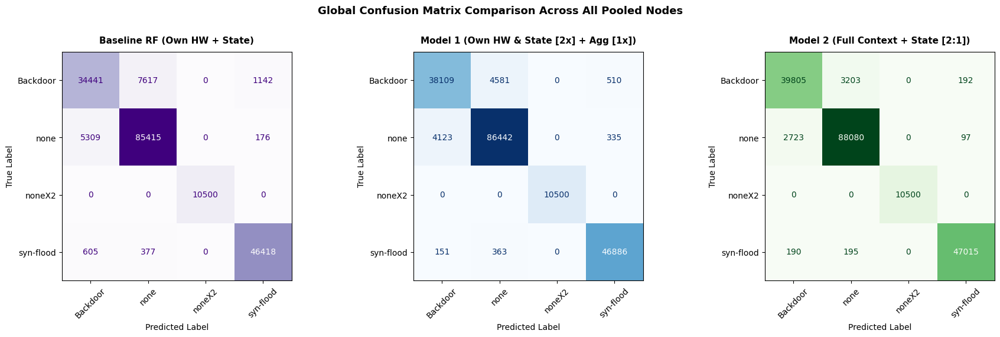

In [4]:
# Cell 4
# =============================================================================
# Side-by-Side Confusion Matrix Plots (Baseline vs. 2:1 Weighted Context Models)
# =============================================================================

import os
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix

PLOTS_DIR = "plots"
os.makedirs(PLOTS_DIR, exist_ok=True)

fig, axes = plt.subplots(1, 3, figsize=(18, 5.5))

# -----------------------------------------------------------------------------
# 1. Baseline RF (Own HW + State)
# -----------------------------------------------------------------------------
cm_base = confusion_matrix(
    df_pred_base["Attack"], df_pred_base["prediction"], labels=classes
)
disp_base = ConfusionMatrixDisplay(confusion_matrix=cm_base, display_labels=classes)
disp_base.plot(ax=axes[0], cmap="Purples", values_format="d", colorbar=False)
axes[0].set_title("Baseline RF (Own HW + State)", fontsize=11, fontweight="bold", pad=10)
axes[0].set_xlabel("Predicted Label", fontsize=10)
axes[0].set_ylabel("True Label", fontsize=10)
axes[0].tick_params(axis="x", rotation=45)

# -----------------------------------------------------------------------------
# 2. Model 1: Own HW & State (2x) + Agg Context (1x)
# -----------------------------------------------------------------------------
cm1 = confusion_matrix(
    df_pred_hw_agg["Attack"], df_pred_hw_agg["prediction"], labels=classes
)
disp1 = ConfusionMatrixDisplay(confusion_matrix=cm1, display_labels=classes)
disp1.plot(ax=axes[1], cmap="Blues", values_format="d", colorbar=False)
axes[1].set_title(
    "Model 1 (Own HW & State [2x] + Agg [1x])", fontsize=11, fontweight="bold", pad=10
)
axes[1].set_xlabel("Predicted Label", fontsize=10)
axes[1].set_ylabel("True Label", fontsize=10)
axes[1].tick_params(axis="x", rotation=45)

# -----------------------------------------------------------------------------
# 3. Model 2: Full Context (Own HW, State & Probs [2x] + Agg [1x])
# -----------------------------------------------------------------------------
cm2 = confusion_matrix(
    df_pred_full["Attack"], df_pred_full["prediction"], labels=classes
)
disp2 = ConfusionMatrixDisplay(confusion_matrix=cm2, display_labels=classes)
disp2.plot(ax=axes[2], cmap="Greens", values_format="d", colorbar=False)
axes[2].set_title(
    "Model 2 (Full Context + State [2:1])", fontsize=11, fontweight="bold", pad=10
)
axes[2].set_xlabel("Predicted Label", fontsize=10)
axes[2].set_ylabel("True Label", fontsize=10)
axes[2].tick_params(axis="x", rotation=45)

fig.suptitle(
    "Global Confusion Matrix Comparison Across All Pooled Nodes",
    fontsize=13,
    fontweight="bold",
    y=1.02,
)
plt.tight_layout()

# Save the plot
output_path = os.path.join(PLOTS_DIR, "confusion_matrices_comparison_w2.png")
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Saved confusion matrix comparison plot to '{output_path}'")

plt.show()
plt.close(fig)

Saved ROC curves comparison plot to 'plots/roc_curves_comparison_w2.png'


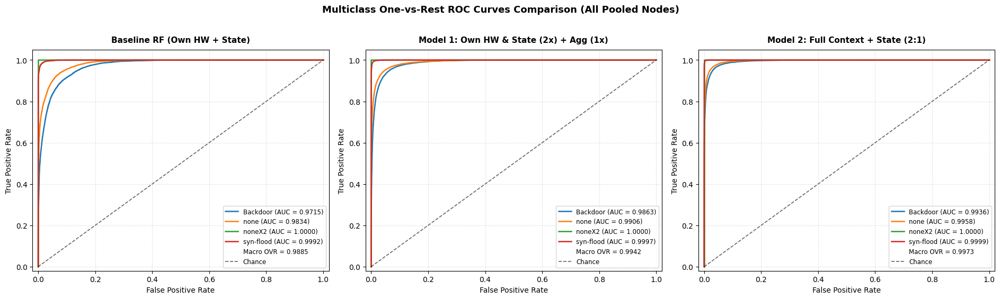

In [5]:
# Cell 5
# =============================================================================
# Multiclass ROC Curves Comparison (Baseline vs. 2:1 Weighted Context Models)
# =============================================================================

import os
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import auc, roc_auc_score, roc_curve
from sklearn.preprocessing import label_binarize

PLOTS_DIR = "plots"
os.makedirs(PLOTS_DIR, exist_ok=True)

num_classes = len(classes)
# Use the central label encoder loaded in Cell 1
y_true_indices = le_base.transform(df_pred_base["Attack"])
y_test_bin = label_binarize(y_true_indices, classes=range(num_classes))
prob_cols = [f"prob_{cls_name}" for cls_name in classes]

fig, axes = plt.subplots(1, 3, figsize=(19, 5.5))

model_dfs = [
    (df_pred_base, "Baseline RF (Own HW + State)", axes[0]),
    (df_pred_hw_agg, "Model 1: Own HW & State (2x) + Agg (1x)", axes[1]),
    (df_pred_full, "Model 2: Full Context + State (2:1)", axes[2])
]

for df_preds, title, ax in model_dfs:
    y_prob = df_preds[prob_cols].values

    # Plot One-vs-Rest ROC curve for each individual class
    for i, cls_name in enumerate(classes):
        fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_prob[:, i])
        roc_score = auc(fpr, tpr)
        ax.plot(fpr, tpr, lw=1.8, label=f"{cls_name} (AUC = {roc_score:.4f})")

    # Compute and plot the Macro-Average ROC score
    try:
        macro_ovr_auc = roc_auc_score(
            y_true_indices,
            y_prob,
            multi_class="ovr",
            average="macro",
            labels=np.arange(num_classes)
        )
        ax.plot([], [], " ", label=f"Macro OVR = {macro_ovr_auc:.4f}")
    except ValueError:
        pass

    # Baseline diagonal line (Random Classifier)
    ax.plot([0, 1], [0, 1], "k--", lw=1.2, alpha=0.6, label="Chance")
    
    ax.set_title(title, fontsize=11, fontweight="bold", pad=10)
    ax.set_xlabel("False Positive Rate", fontsize=10)
    ax.set_ylabel("True Positive Rate", fontsize=10)
    ax.set_xlim([-0.02, 1.02])
    ax.set_ylim([-0.02, 1.05])
    ax.legend(loc="lower right", fontsize=8.5, frameon=True)
    ax.grid(True, linestyle=":", alpha=0.6)

fig.suptitle(
    "Multiclass One-vs-Rest ROC Curves Comparison (All Pooled Nodes)",
    fontsize=13,
    fontweight="bold",
    y=1.02
)
plt.tight_layout()

# Save figure
output_path = os.path.join(PLOTS_DIR, "roc_curves_comparison_w2.png")
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Saved ROC curves comparison plot to '{output_path}'")

plt.show()
plt.close(fig)

Saved feature importance comparison plot to 'plots/feature_importance_3model_comparison_w2.png'


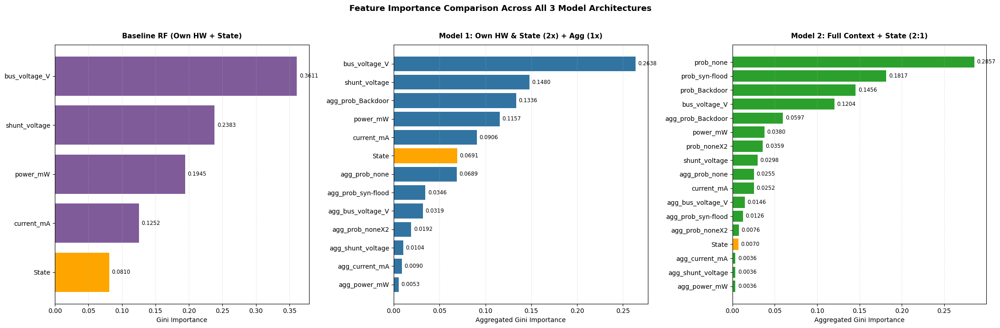

In [6]:
# Cell 6
# =============================================================================
# Feature Importance Comparison Across All 3 Model Architectures (With State)
# =============================================================================

import os
import joblib
import matplotlib.pyplot as plt
import pandas as pd

MODELS_DIR = "models"
PLOTS_DIR = "plots"
os.makedirs(PLOTS_DIR, exist_ok=True)

# -----------------------------------------------------------------------------
# 1. Baseline Model Feature Importance (Single Binary State)
# -----------------------------------------------------------------------------
rf_base = joblib.load(os.path.join(MODELS_DIR, "rf_final.joblib"))
feat_base = ["shunt_voltage", "bus_voltage_V", "current_mA", "power_mW", "State"]

df_imp_base = pd.DataFrame({
    "Feature": feat_base,
    "Importance": rf_base.feature_importances_
}).sort_values("Importance", ascending=True)

# -----------------------------------------------------------------------------
# 2. Global Model 1 Feature Importance (Own HW & State 2x + Agg Context 1x)
# -----------------------------------------------------------------------------
rf_m1_global = joblib.load(os.path.join(MODELS_DIR, "global_rf_model1_own_hw_plus_agg_state.joblib"))

original_numeric = ["shunt_voltage", "bus_voltage_V", "current_mA", "power_mW"]
local_features = original_numeric + ["State"]
agg_numeric = [f"agg_{f}" for f in original_numeric]
agg_prob_cols = [f"agg_prob_{c}" for c in classes]

feature_cols_m1 = local_features + agg_numeric + agg_prob_cols
own_cols_m1 = [c for c in feature_cols_m1 if not c.startswith("agg_")]

# Build full 2:1 duplicated column list as passed during training
full_cols_m1 = feature_cols_m1 + [f"{c}_w2" for c in own_cols_m1]

df_raw1 = pd.DataFrame({
    "Feature": [f.replace("_w2", "") for f in full_cols_m1],
    "Importance": rf_m1_global.feature_importances_
})
df_imp_1 = (
    df_raw1.groupby("Feature", as_index=False)
    .sum()
    .sort_values("Importance", ascending=True)
)

# -----------------------------------------------------------------------------
# 3. Global Model 2 Feature Importance (Full Context: HW, State & Probs 2x + Agg 1x)
# -----------------------------------------------------------------------------
rf_m2_global = joblib.load(os.path.join(MODELS_DIR, "global_rf_model2_full_context_state.joblib"))

own_prob_cols = [f"prob_{c}" for c in classes]
feature_cols_m2 = local_features + own_prob_cols + agg_numeric + agg_prob_cols
own_cols_m2 = [c for c in feature_cols_m2 if not c.startswith("agg_")]

# Build full 2:1 duplicated column list as passed during training
full_cols_m2 = feature_cols_m2 + [f"{c}_w2" for c in own_cols_m2]

df_raw2 = pd.DataFrame({
    "Feature": [f.replace("_w2", "") for f in full_cols_m2],
    "Importance": rf_m2_global.feature_importances_
})
df_imp_2 = (
    df_raw2.groupby("Feature", as_index=False)
    .sum()
    .sort_values("Importance", ascending=True)
)

# -----------------------------------------------------------------------------
# 4. Side-by-Side 3-Panel Plot (Highlighting State in Orange)
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(22, 7))

# 1. Baseline Model
colors_base = ["orange" if f == "State" else "#805B9A" for f in df_imp_base["Feature"]]
bars0 = axes[0].barh(df_imp_base["Feature"], df_imp_base["Importance"], color=colors_base)
axes[0].set_title("Baseline RF (Own HW + State)", fontsize=11, fontweight="bold", pad=10)
axes[0].set_xlabel("Gini Importance", fontsize=10)
axes[0].grid(True, axis="x", linestyle=":", alpha=0.6)

for bar in bars0:
    w = bar.get_width()
    axes[0].annotate(f"{w:.4f}", (w, bar.get_y() + bar.get_height() / 2.0),
                     ha="left", va="center", fontsize=8.5, xytext=(4, 0), textcoords="offset points")

# 2. Model 1
colors_m1 = ["orange" if f == "State" else "#3274A1" for f in df_imp_1["Feature"]]
bars1 = axes[1].barh(df_imp_1["Feature"], df_imp_1["Importance"], color=colors_m1)
axes[1].set_title("Model 1: Own HW & State (2x) + Agg (1x)", fontsize=11, fontweight="bold", pad=10)
axes[1].set_xlabel("Aggregated Gini Importance", fontsize=10)
axes[1].grid(True, axis="x", linestyle=":", alpha=0.6)

for bar in bars1:
    w = bar.get_width()
    axes[1].annotate(f"{w:.4f}", (w, bar.get_y() + bar.get_height() / 2.0),
                     ha="left", va="center", fontsize=8.5, xytext=(4, 0), textcoords="offset points")

# 3. Model 2
colors_m2 = ["orange" if f == "State" else "#2CA02C" for f in df_imp_2["Feature"]]
bars2 = axes[2].barh(df_imp_2["Feature"], df_imp_2["Importance"], color=colors_m2)
axes[2].set_title("Model 2: Full Context + State (2:1)", fontsize=11, fontweight="bold", pad=10)
axes[2].set_xlabel("Aggregated Gini Importance", fontsize=10)
axes[2].grid(True, axis="x", linestyle=":", alpha=0.6)

for bar in bars2:
    w = bar.get_width()
    axes[2].annotate(f"{w:.4f}", (w, bar.get_y() + bar.get_height() / 2.0),
                     ha="left", va="center", fontsize=8.5, xytext=(4, 0), textcoords="offset points")

fig.suptitle(
    "Feature Importance Comparison Across All 3 Model Architectures",
    fontsize=13,
    fontweight="bold",
    y=1.02
)
plt.tight_layout()

# Save plot
output_path = os.path.join(PLOTS_DIR, "feature_importance_3model_comparison_w2.png")
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Saved feature importance comparison plot to '{output_path}'")

plt.show()
plt.close(fig)

In [7]:
# Cell 9 (Notebook 07)
# =============================================================================
# Evaluate Baseline, Model 1, and Model 2 on Real/Original Dataset
# =============================================================================

import os
import joblib
import numpy as np
import pandas as pd
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    log_loss,
    mean_squared_error,
    roc_auc_score,
)

MODELS_DIR = "models"
ORIG_DIR = "dataset_original_only/normalized"
ORIG_AUG_DIR = os.path.join(ORIG_DIR, "augmented_csv")
NODES = ["A", "B", "C", "D", "E", "F", "G", "H"]

# -----------------------------------------------------------------------------
# 1. Load Real Baseline Test Data & Predict
# -----------------------------------------------------------------------------
df_real_raw = pd.concat(
    [pd.read_csv(os.path.join(ORIG_DIR, f"Node_{node}_test_normalized.csv")) for node in NODES],
    ignore_index=True
)

state_mapping = {"idle": 0, "charging": 1}
if df_real_raw["State"].dtype == object or isinstance(df_real_raw["State"].iloc[0], str):
    df_real_raw["State"] = df_real_raw["State"].map(state_mapping).fillna(0).astype(int)

X_real_base = df_real_raw[base_expected_order].copy()
X_real_base[base_numeric_cols] = scaler_base.transform(X_real_base[base_numeric_cols])

prob_real_base = rf_base.predict_proba(X_real_base.to_numpy())
pred_real_base = np.argmax(prob_real_base, axis=1)

y_real_true_base = le_base.transform(df_real_raw["Attack"])

# -----------------------------------------------------------------------------
# 2. Load Real Augmented Data & Predict (Models 1 and 2)
# -----------------------------------------------------------------------------
df_real_m1_list = []
df_real_m2_list = []
y_real_true_list = []

for node in NODES:
    test_df = pd.read_csv(os.path.join(ORIG_AUG_DIR, f"Node_{node}_combined_augmented_test.csv"))
    
    if test_df["State"].dtype == object or isinstance(test_df["State"].iloc[0], str):
        test_df["State"] = test_df["State"].map(state_mapping).fillna(0).astype(int)
        
    y_real_true_list.append(le_base.transform(test_df["Attack"]))

    # Model 1
    X_m1 = test_df[feature_cols_m1].copy()
    for col in own_cols_m1:
        X_m1[f"{col}_w2"] = X_m1[col]
    X_m1[numeric_all_m1] = scaler_m1.transform(X_m1[numeric_all_m1])
    prob_m1 = rf_m1_global.predict_proba(X_m1.to_numpy())
    df_real_m1_list.append(prob_m1)

    # Model 2
    X_m2 = test_df[feature_cols_m2].copy()
    for col in own_cols_m2:
        X_m2[f"{col}_w2"] = X_m2[col]
    X_m2[numeric_all_m2] = scaler_m2.transform(X_m2[numeric_all_m2])
    prob_m2 = rf_m2_global.predict_proba(X_m2.to_numpy())
    df_real_m2_list.append(prob_m2)

y_real_true = np.concatenate(y_real_true_list)
prob_real_m1 = np.concatenate(df_real_m1_list, axis=0)
pred_real_m1 = np.argmax(prob_real_m1, axis=1)

prob_real_m2 = np.concatenate(df_real_m2_list, axis=0)
pred_real_m2 = np.argmax(prob_real_m2, axis=1)

# -----------------------------------------------------------------------------
# 3. Metrics Summary Comparison (Synthetic vs. Real)
# -----------------------------------------------------------------------------
def get_metrics_dict(y_true, y_pred, y_prob, model_name):
    num_classes = len(classes)
    labels_arr = np.arange(num_classes)
    acc = accuracy_score(y_true, y_pred)
    macro_f1 = f1_score(y_true, y_pred, average="macro")
    weighted_f1 = f1_score(y_true, y_pred, average="weighted")
    mse = mean_squared_error(y_true, y_pred)
    loss = log_loss(y_true, y_prob, labels=labels_arr)
    try:
        auc = roc_auc_score(y_true, y_prob, multi_class="ovr", average="macro", labels=labels_arr)
    except ValueError:
        auc = np.nan
    return {
        "Configuration": model_name,
        "Accuracy": round(acc, 6),
        "Macro F1": round(macro_f1, 6),
        "Weighted F1": round(weighted_f1, 6),
        "MSE": round(mse, 6),
        "Log Loss": round(loss, 6),
        "ROC-AUC": round(auc, 6),
    }

metrics_compare = [
    get_metrics_dict(le_base.transform(df_pred_base["Attack"]), le_base.transform(df_pred_base["prediction"]), df_pred_base[[f"prob_{c}" for c in classes]].values, "Synthetic: Baseline RF"),
    get_metrics_dict(y_real_true_base, pred_real_base, prob_real_base, "Real:      Baseline RF"),
    get_metrics_dict(le_base.transform(df_pred_hw_agg["Attack"]), le_base.transform(df_pred_hw_agg["prediction"]), df_pred_hw_agg[[f"prob_{c}" for c in classes]].values, "Synthetic: Model 1 (HW+Agg)"),
    get_metrics_dict(y_real_true, pred_real_m1, prob_real_m1, "Real:      Model 1 (HW+Agg)"),
    get_metrics_dict(le_base.transform(df_pred_full["Attack"]), le_base.transform(df_pred_full["prediction"]), df_pred_full[[f"prob_{c}" for c in classes]].values, "Synthetic: Model 2 (Full Context)"),
    get_metrics_dict(y_real_true, pred_real_m2, prob_real_m2, "Real:      Model 2 (Full Context)"),
]

print("=== Synthetic vs. Real Test Performance Benchmark ===")
print(pd.DataFrame(metrics_compare).to_string(index=False))

=== Synthetic vs. Real Test Performance Benchmark ===
                    Configuration  Accuracy  Macro F1  Weighted F1      MSE  Log Loss  ROC-AUC
           Synthetic: Baseline RF  0.920698  0.931771     0.919896 0.160734  0.201272 0.988528
           Real:      Baseline RF  0.880820  0.893760     0.879648 0.265547  0.272979 0.975533
      Synthetic: Model 1 (HW+Agg)  0.947589  0.956178     0.947433 0.090859  0.138893 0.994158
      Real:      Model 1 (HW+Agg)  0.855586  0.879950     0.860789 0.345078  0.336693 0.971702
Synthetic: Model 2 (Full Context)  0.965625  0.971343     0.965582 0.054854  0.089103 0.997332
Real:      Model 2 (Full Context)  0.279219  0.180847     0.277573 3.036211  1.427557 0.683162


In [9]:
# Cell 1: Configuration, Index-Based Block Partitioning & Setup
# =============================================================================

import os
import joblib
import numpy as np
import pandas as pd

MODELS_DIR = "models"
BASE_DIR = "dataset/normalized"
AUG_DIR = os.path.join(BASE_DIR, "augmented_csv")
NODES = ["A", "B", "C", "D", "E", "F", "G", "H"]
TOTAL_BLOCKS = 80

# -----------------------------------------------------------------------------
# 1. Load Test Datasets, Encode Binary State & Assign Block IDs (1 to 58)
# -----------------------------------------------------------------------------
aug_test = {}
state_mapping = {"idle": 0, "charging": 1}

for node in NODES:
    test_file_path = os.path.join(AUG_DIR, f"Node_{node}_combined_augmented_test.csv")
    df = pd.read_csv(test_file_path)
    
    # Ensure binary State encoding (idle: 0, charging: 1)
    if df["State"].dtype == object or isinstance(df["State"].iloc[0], str):
        df["State"] = df["State"].map(state_mapping).fillna(0).astype(int)
    
    # Calculate rows per block and assign block numbers (1 to 58)
    n_rows = len(df)
    block_size = n_rows // TOTAL_BLOCKS
    
    # Map row indices to 1-based block IDs
    block_ids = np.clip((np.arange(n_rows) // block_size) + 1, 1, TOTAL_BLOCKS)
    df["block_id"] = block_ids
    
    aug_test[node] = df
    print(f"Loaded Node {node}: {n_rows} rows (~{block_size} rows/block across {TOTAL_BLOCKS} blocks)")

# -----------------------------------------------------------------------------
# 2. Define the 9 Correlation Scenarios by Block IDs (1-based)
# -----------------------------------------------------------------------------

SCENARIOS = {
    # 1. Distraction Attack 1
    "Distraction Attack 1": [3, 4, 5, 6, 7, 8, 9, 10],
    "DA1 - Syn: 3, Back: 0, Benign: 5": [3, 4],
    "DA1 - Syn: 4, Back: 1, Benign: 3": [5, 6],
    "DA1 - Syn: 5, Back: 1, Benign: 2": [7, 8, 9, 10],

    # 2. Distraction Attack 2
    "Distraction Attack 2": [13, 14, 15, 16, 17, 18, 19, 20, 21],
    "DA2 - Syn: 1, Back: 0, Benign: 7": [13],
    "DA2 - Syn: 2, Back: 1, Benign: 5": [14],
    "DA2 - Syn: 3, Back: 2, Benign: 3": [15],
    "DA2 - Syn: 4, Back: 2, Benign: 2": [16],
    "DA2 - Syn: 5, Back: 2, Benign: 1": [17, 18, 19, 20, 21],

    # 3. Distributed Syn-Flood
    "Distributed Syn-Flood": [24, 25, 26, 27, 28, 29, 30, 31, 32, 33],
    "DSF - Syn: 1, Back: 0, Benign: 7": [24],
    "DSF - Syn: 2, Back: 0, Benign: 6": [25],
    "DSF - Syn: 3, Back: 0, Benign: 5": [26],
    "DSF - Syn: 4, Back: 0, Benign: 4": [27],
    "DSF - Syn: 5, Back: 0, Benign: 3": [28],
    "DSF - Syn: 6, Back: 0, Benign: 2": [29, 30],
    "DSF - Syn: 7, Back: 0, Benign: 1": [31, 32, 33],

    # 4. Worm Propagation - Backdoor
    "Worm-Backdoor": list(range(37, 57)),
    "WB - Syn: 0, Back: 1, Benign: 7": [37],
    "WB - Syn: 0, Back: 2, Benign: 6": [38],
    "WB - Syn: 0, Back: 3, Benign: 5": [39, 40],
    "WB - Syn: 0, Back: 4, Benign: 4": [41, 42],
    "WB - Syn: 0, Back: 5, Benign: 3": [43, 44],
    "WB - Syn: 0, Back: 6, Benign: 2": [45, 46, 47],
    "WB - Syn: 0, Back: 7, Benign: 1": [48, 49],
    "WB - Syn: 0, Back: 8, Benign: 0": [50, 51, 52, 53, 54, 55, 56, 57],

    # 5. Cluster Shuffling Syn-Flood
    "cluster Shuffling Syn-Flood": [64, 65, 66, 67, 68, 69, 70, 71, 72, 73],
    "CSSF - Node A-D (Syn: 4, Back: 0, Benign: 4)": [64, 65, 66, 67, 68],
    "CSSF - Node E-H (Syn: 4, Back: 0, Benign: 4)": [69, 70, 71, 72, 73],

    # 6. Global Fluctuation (False Positive Test)
    "Globale-Schwankung": [76, 77, 78, 79, 80],
}

# -----------------------------------------------------------------------------
# 3. Load Central Label Encoder, Baseline & Global Context Models
# -----------------------------------------------------------------------------
le = joblib.load(os.path.join(MODELS_DIR, "label_encoder.joblib"))
classes = le.classes_
num_classes = len(classes)
labels_arr = np.arange(num_classes)

# Load Baseline Model & Scaler
rf_base = joblib.load(os.path.join(MODELS_DIR, "rf_final.joblib"))
scaler_base = joblib.load(os.path.join(MODELS_DIR, "scaler.joblib"))
base_numeric_cols = ["shunt_voltage", "bus_voltage_V", "current_mA", "power_mW"]
base_expected_order = ["shunt_voltage", "bus_voltage_V", "current_mA", "power_mW", "State"]

# Load Global Context Models & Scalers
rf_m1_global = joblib.load(os.path.join(MODELS_DIR, "global_rf_model1_own_hw_plus_agg_state.joblib"))
scaler_m1 = joblib.load(os.path.join(MODELS_DIR, "global_scaler_model1_state.joblib"))

rf_m2_global = joblib.load(os.path.join(MODELS_DIR, "global_rf_model2_full_context_state.joblib"))
scaler_m2 = joblib.load(os.path.join(MODELS_DIR, "global_scaler_model2_state.joblib"))

# -----------------------------------------------------------------------------
# 4. Define Feature Sets (Hardware, Binary State & Contexts)
# -----------------------------------------------------------------------------
original_numeric = ["shunt_voltage", "bus_voltage_V", "current_mA", "power_mW"]
local_features = original_numeric + ["State"]

own_prob_cols = [f"prob_{cls_name}" for cls_name in classes]
agg_numeric = [f"agg_{f}" for f in original_numeric]
agg_prob_cols = [f"agg_prob_{cls_name}" for cls_name in classes]

# Model 1 Features: Local HW + State + Aggregated Context
feature_cols_hw_plus_agg = local_features + agg_numeric + agg_prob_cols

# Model 2 Features: Local HW + State + Own Probs + Aggregated Context
feature_cols_full = local_features + own_prob_cols + agg_numeric + agg_prob_cols

# 2:1 sampling column mappings
own_cols_m1 = [c for c in feature_cols_hw_plus_agg if not c.startswith("agg_")]
numeric_own_m1 = [c for c in own_cols_m1 if c in original_numeric]
numeric_all_m1 = numeric_own_m1 + [f"{c}_w2" for c in numeric_own_m1] + agg_numeric

own_cols_m2 = [c for c in feature_cols_full if not c.startswith("agg_")]
numeric_own_m2 = [c for c in own_cols_m2 if c in original_numeric]
numeric_all_m2 = numeric_own_m2 + [f"{c}_w2" for c in numeric_own_m2] + agg_numeric

print("\nSetup completed successfully.")
print(f"Classes: {classes}")
print(f"Model 1 features ({len(feature_cols_hw_plus_agg)}): {feature_cols_hw_plus_agg}")
print(f"Model 2 features ({len(feature_cols_full)}): {feature_cols_full}")

Loaded Node A: 24000 rows (~300 rows/block across 80 blocks)
Loaded Node B: 24000 rows (~300 rows/block across 80 blocks)
Loaded Node C: 24000 rows (~300 rows/block across 80 blocks)
Loaded Node D: 24000 rows (~300 rows/block across 80 blocks)
Loaded Node E: 24000 rows (~300 rows/block across 80 blocks)
Loaded Node F: 24000 rows (~300 rows/block across 80 blocks)
Loaded Node G: 24000 rows (~300 rows/block across 80 blocks)
Loaded Node H: 24000 rows (~300 rows/block across 80 blocks)

Setup completed successfully.
Classes: ['Backdoor' 'none' 'noneX2' 'syn-flood']
Model 1 features (13): ['shunt_voltage', 'bus_voltage_V', 'current_mA', 'power_mW', 'State', 'agg_shunt_voltage', 'agg_bus_voltage_V', 'agg_current_mA', 'agg_power_mW', 'agg_prob_Backdoor', 'agg_prob_none', 'agg_prob_noneX2', 'agg_prob_syn-flood']
Model 2 features (17): ['shunt_voltage', 'bus_voltage_V', 'current_mA', 'power_mW', 'State', 'prob_Backdoor', 'prob_none', 'prob_noneX2', 'prob_syn-flood', 'agg_shunt_voltage', 'agg_b

/home/yannic/Desktop/Master_rbg/Semester2/Forschungsarbeit 2/.venvDatasets/lib/python3.12/site-packages/sklearn/metrics/_ranking.py:469: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
/home/yannic/Desktop/Master_rbg/Semester2/Forschungsarbeit 2/.venvDatasets/lib/python3.12/site-packages/sklearn/metrics/_ranking.py:469: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
/home/yannic/Desktop/Master_rbg/Semester2/Forschungsarbeit 2/.venvDatasets/lib/python3.12/site-packages/sklearn/metrics/_ranking.py:469: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
/home/yannic/Desktop/Master_rbg/Semester2/Forschungsarbeit 2/.venvDatasets/lib/python3.12/site-packages/sklearn/metrics/_ranking.py:469: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined

/home/yannic/Desktop/Master_rbg/Semester2/Forschungsarbeit 2/.venvDatasets/lib/python3.12/site-packages/sklearn/metrics/_ranking.py:469: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
/home/yannic/Desktop/Master_rbg/Semester2/Forschungsarbeit 2/.venvDatasets/lib/python3.12/site-packages/sklearn/metrics/_ranking.py:469: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
/home/yannic/Desktop/Master_rbg/Semester2/Forschungsarbeit 2/.venvDatasets/lib/python3.12/site-packages/sklearn/metrics/_ranking.py:469: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
/home/yannic/Desktop/Master_rbg/Semester2/Forschungsarbeit 2/.venvDatasets/lib/python3.12/site-packages/sklearn/metrics/_ranking.py:469: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined

/home/yannic/Desktop/Master_rbg/Semester2/Forschungsarbeit 2/.venvDatasets/lib/python3.12/site-packages/sklearn/metrics/_ranking.py:469: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
/home/yannic/Desktop/Master_rbg/Semester2/Forschungsarbeit 2/.venvDatasets/lib/python3.12/site-packages/sklearn/metrics/_ranking.py:469: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
/home/yannic/Desktop/Master_rbg/Semester2/Forschungsarbeit 2/.venvDatasets/lib/python3.12/site-packages/sklearn/metrics/_ranking.py:469: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
/home/yannic/Desktop/Master_rbg/Semester2/Forschungsarbeit 2/.venvDatasets/lib/python3.12/site-packages/sklearn/metrics/_ranking.py:469: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined

/home/yannic/Desktop/Master_rbg/Semester2/Forschungsarbeit 2/.venvDatasets/lib/python3.12/site-packages/sklearn/metrics/_ranking.py:469: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
/home/yannic/Desktop/Master_rbg/Semester2/Forschungsarbeit 2/.venvDatasets/lib/python3.12/site-packages/sklearn/metrics/_ranking.py:469: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
/home/yannic/Desktop/Master_rbg/Semester2/Forschungsarbeit 2/.venvDatasets/lib/python3.12/site-packages/sklearn/metrics/_ranking.py:469: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
/home/yannic/Desktop/Master_rbg/Semester2/Forschungsarbeit 2/.venvDatasets/lib/python3.12/site-packages/sklearn/metrics/_ranking.py:469: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined

Saved plot: plots/scenario_comparison_Distraction_Attack_1.png


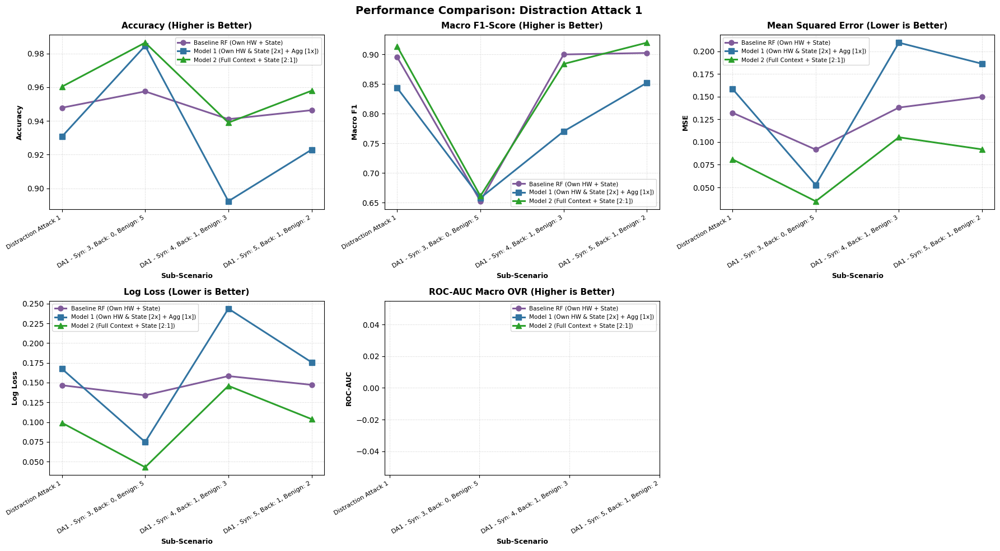

Saved plot: plots/scenario_comparison_Distraction_Attack_2.png


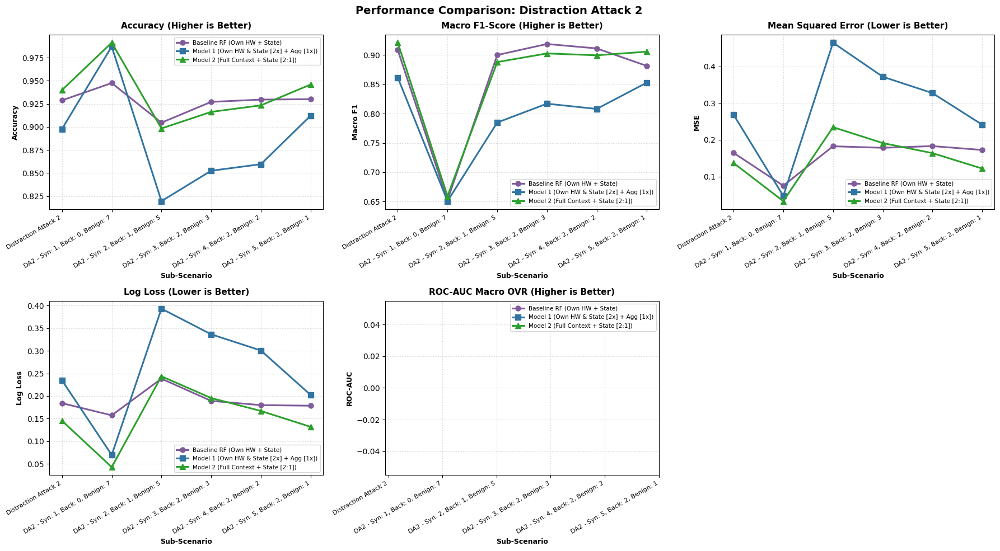

Saved plot: plots/scenario_comparison_Distributed_Syn_Flood.png


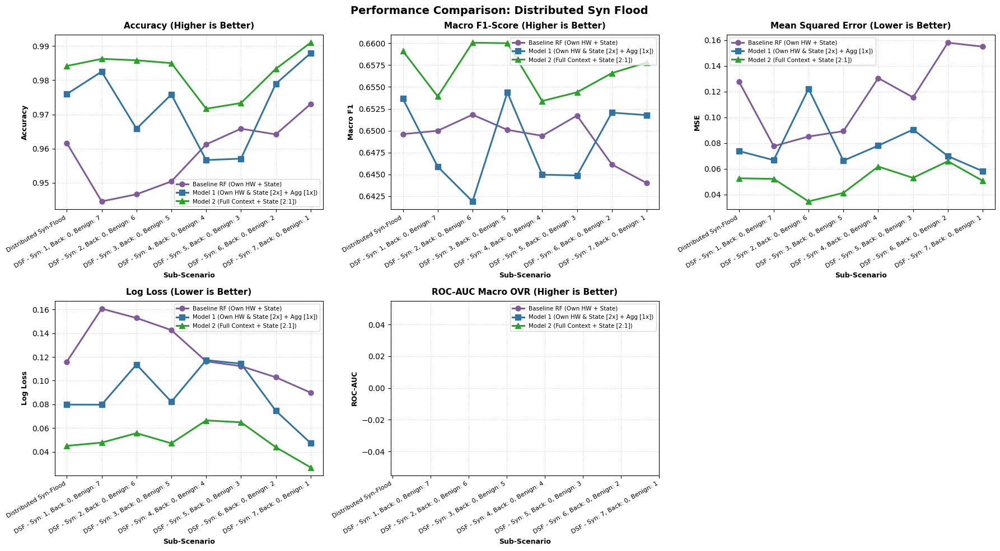

Saved plot: plots/scenario_comparison_Worm_Backdoor.png


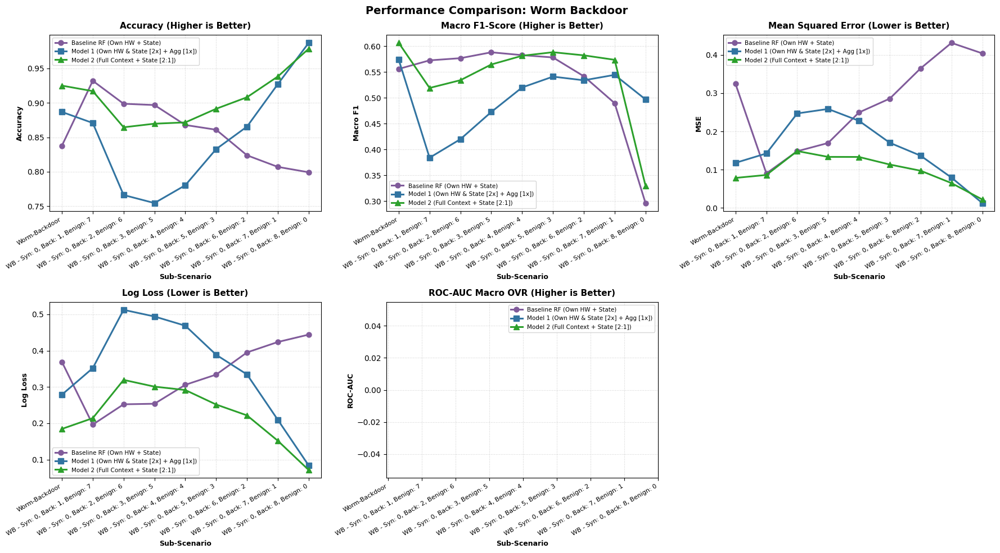

Saved plot: plots/scenario_comparison_Cluster_Shuffling_Syn_Flood.png


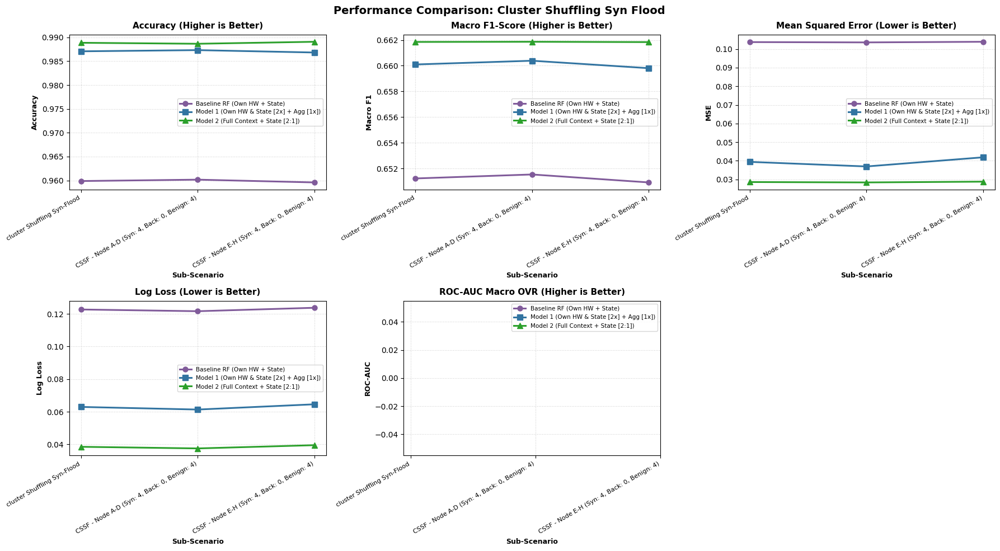

Saved plot: plots/scenario_comparison_Globale_Schwankung.png


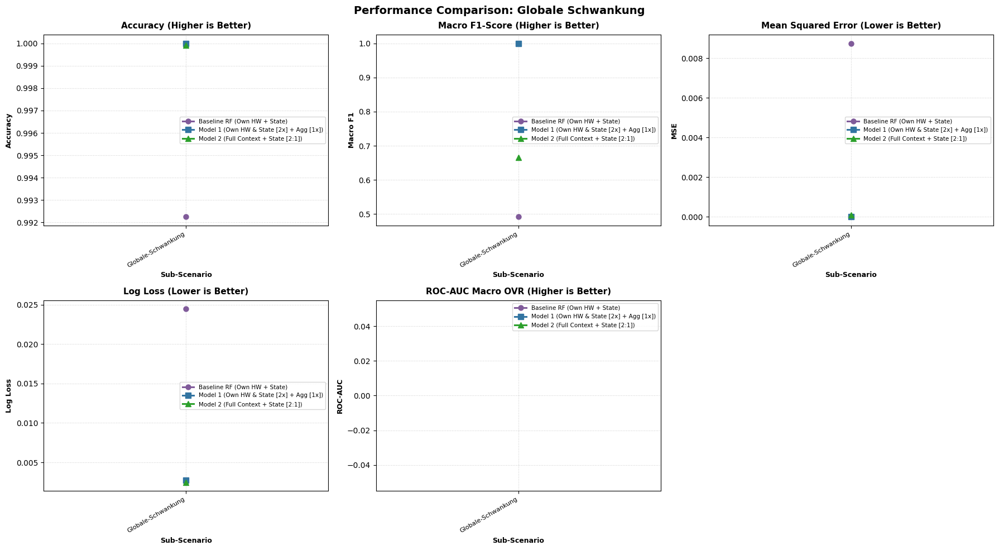

In [14]:
# Cell 4: Separate Plots for Each Scenario Category
# =============================================================================

import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.metrics import accuracy_score, f1_score, log_loss, mean_squared_error, roc_auc_score

PLOTS_DIR = "plots"
os.makedirs(PLOTS_DIR, exist_ok=True)

# 1. Definieren der logischen Szenario-Gruppen (Zuordnung Name zu Block-IDs)
SCENARIO_GROUPS = {
    "Distraction_Attack_1": [
        "Distraction Attack 1",
        "DA1 - Syn: 3, Back: 0, Benign: 5",
        "DA1 - Syn: 4, Back: 1, Benign: 3",
        "DA1 - Syn: 5, Back: 1, Benign: 2",
    ],
    "Distraction_Attack_2": [
        "Distraction Attack 2",
        "DA2 - Syn: 1, Back: 0, Benign: 7",
        "DA2 - Syn: 2, Back: 1, Benign: 5",
        "DA2 - Syn: 3, Back: 2, Benign: 3",
        "DA2 - Syn: 4, Back: 2, Benign: 2",
        "DA2 - Syn: 5, Back: 2, Benign: 1",
    ],
    "Distributed_Syn_Flood": [
        "Distributed Syn-Flood",
        "DSF - Syn: 1, Back: 0, Benign: 7",
        "DSF - Syn: 2, Back: 0, Benign: 6",
        "DSF - Syn: 3, Back: 0, Benign: 5",
        "DSF - Syn: 4, Back: 0, Benign: 4",
        "DSF - Syn: 5, Back: 0, Benign: 3",
        "DSF - Syn: 6, Back: 0, Benign: 2",
        "DSF - Syn: 7, Back: 0, Benign: 1",
    ],
    "Worm_Backdoor": [
        "Worm-Backdoor",
        "WB - Syn: 0, Back: 1, Benign: 7",
        "WB - Syn: 0, Back: 2, Benign: 6",
        "WB - Syn: 0, Back: 3, Benign: 5",
        "WB - Syn: 0, Back: 4, Benign: 4",
        "WB - Syn: 0, Back: 5, Benign: 3",
        "WB - Syn: 0, Back: 6, Benign: 2",
        "WB - Syn: 0, Back: 7, Benign: 1",
        "WB - Syn: 0, Back: 8, Benign: 0",
    ],
    "Cluster_Shuffling_Syn_Flood": [
        "cluster Shuffling Syn-Flood",
        "CSSF - Node A-D (Syn: 4, Back: 0, Benign: 4)",
        "CSSF - Node E-H (Syn: 4, Back: 0, Benign: 4)",
    ],
    "Globale_Schwankung": [
        "Globale-Schwankung",
    ],
}

# 2. DataFrame `df_scen` aus den Testdaten und Modellen generieren
eval_records = []

for scen_name, blocks in SCENARIOS.items():
    # Sammle Daten über alle Knoten für die jeweiligen Block-IDs
    scen_data_list = []
    for node in NODES:
        df_node = aug_test[node]
        sub_df = df_node[df_node["block_id"].isin(blocks)]
        if len(sub_df) > 0:
            scen_data_list.append(sub_df)
            
    if not scen_data_list:
        continue
    scen_df = pd.concat(scen_data_list, ignore_index=True)
    y_true = le_base.transform(scen_df["Attack"])
    
    # Modelle evaluieren
    models_to_eval = [
        ("Baseline RF (Own HW + State)", scaler_base, rf_base, base_expected_order, base_numeric_cols),
        ("Model 1 (Own HW & State [2x] + Agg [1x])", scaler_m1, rf_m1_global, feature_cols_hw_plus_agg, numeric_all_m1),
        ("Model 2 (Full Context + State [2:1])", scaler_m2, rf_m2_global, feature_cols_full, numeric_all_m2)
    ]
    
    for model_name, scaler_m, rf_m, feat_cols, num_cols in models_to_eval:
        X_m = scen_df[feat_cols].copy()
        if "w2" in num_cols or any("_w2" in c for c in num_cols):
            # 2:1 Duplizierung falls benötigt
            own_cols = [c for c in feat_cols if not c.startswith("agg_")]
            for col in own_cols:
                if f"{col}_w2" not in X_m.columns:
                    X_m[f"{col}_w2"] = X_m[col]
                    
        X_m[num_cols] = scaler_m.transform(X_m[num_cols])
        probs = rf_m.predict_proba(X_m.to_numpy())
        preds = np.argmax(probs, axis=1)
        
        acc = accuracy_score(y_true, preds)
        macro_f1 = f1_score(y_true, preds, average="macro")
        mse = mean_squared_error(y_true, preds)
        loss = log_loss(y_true, probs, labels=labels_arr)
        try:
            roc_auc = roc_auc_score(y_true, probs, multi_class="ovr", average="macro", labels=labels_arr)
        except ValueError:
            roc_auc = np.nan
            
        eval_records.append({
            "Scenario": scen_name,
            "Model": model_name,
            "Accuracy": acc,
            "Macro F1": macro_f1,
            "MSE": mse,
            "Log Loss": loss,
            "ROC-AUC": roc_auc
        })

df_scen = pd.DataFrame(eval_records)

# 3. Styling und Plot-Generierung
model_styles = {
    "Baseline RF (Own HW + State)": {
        "color": "#805B9A", "marker": "o", "linestyle": "-", "label": "Baseline RF (Own HW + State)",
    },
    "Model 1 (Own HW & State [2x] + Agg [1x])": {
        "color": "#3274A1", "marker": "s", "linestyle": "-", "label": "Model 1 (Own HW & State [2x] + Agg [1x])",
    },
    "Model 2 (Full Context + State [2:1])": {
        "color": "#2CA02C", "marker": "^", "linestyle": "-", "label": "Model 2 (Full Context + State [2:1])",
    },
}

metrics_to_plot = [
    ("Accuracy", "Accuracy (Higher is Better)"),
    ("Macro F1", "Macro F1-Score (Higher is Better)"),
    ("MSE", "Mean Squared Error (Lower is Better)"),
    ("Log Loss", "Log Loss (Lower is Better)"),
    ("ROC-AUC", "ROC-AUC Macro OVR (Higher is Better)"),
]

import warnings
from sklearn.exceptions import UndefinedMetricWarning

# Unterdrückt die spezifische ROC-AUC-Warnung
warnings.filterwarnings("ignore", category=UndefinedMetricWarning)


for group_name, scenarios in SCENARIO_GROUPS.items():
    valid_scenarios = [s for s in scenarios if s in df_scen["Scenario"].values]
    if not valid_scenarios:
        continue

    x_indices = np.arange(len(valid_scenarios))

    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    axes_flat = axes.flatten()

    for idx, (metric_col, metric_title) in enumerate(metrics_to_plot):
        ax = axes_flat[idx]

        for model_name, style in model_styles.items():
            df_model = (
                df_scen[df_scen["Model"] == model_name]
                .set_index("Scenario")
                .reindex(valid_scenarios)
            )
            y_values = df_model[metric_col].values

            ax.plot(
                x_indices,
                y_values,
                color=style["color"],
                marker=style["marker"],
                linestyle=style["linestyle"],
                linewidth=2.2,
                markersize=6.5,
                label=style["label"],
            )

        ax.set_title(metric_title, fontsize=11, fontweight="bold", pad=8)
        ax.set_xlabel("Sub-Scenario", fontsize=9, fontweight="bold")
        ax.set_ylabel(metric_col, fontsize=9, fontweight="bold")
        ax.set_xticks(x_indices)
        ax.set_xticklabels(valid_scenarios, rotation=30, ha="right", fontsize=8)
        ax.grid(True, linestyle=":", alpha=0.6)
        ax.legend(loc="best", fontsize=7.5, frameon=True)

    fig.delaxes(axes_flat[-1])

    formatted_title = group_name.replace("_", " ")
    fig.suptitle(
        f"Performance Comparison: {formatted_title}",
        fontsize=14,
        fontweight="bold",
        y=0.98,
    )

    plt.tight_layout()

    out_file = os.path.join(PLOTS_DIR, f"scenario_comparison_{group_name}.png")
    fig.savefig(out_file, dpi=300, bbox_inches="tight")
    print(f"Saved plot: {out_file}")

    plt.show()
    plt.close(fig)

Saved complete 9x3 confusion matrix grid to 'plots/scenarios_all_confusion_matrices_grid.png'


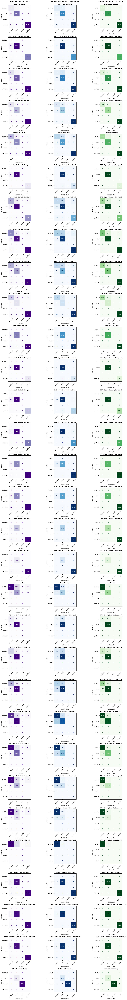

In [15]:
# Cell 5
# =============================================================================
# Multi-Panel Confusion Matrix Grid: 9 Scenarios x 3 Models (Attack Types)
# =============================================================================

import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix

PLOTS_DIR = "plots"
os.makedirs(PLOTS_DIR, exist_ok=True)

scen_order = list(SCENARIOS.keys())
n_scenarios = len(scen_order)
n_models = 3

fig, axes = plt.subplots(n_scenarios, n_models, figsize=(18, 4 * n_scenarios))

for row_idx, scen_name in enumerate(scen_order):
    blocks = SCENARIOS[scen_name]
    
    y_true_list = []
    y_pred_base_list = []
    y_pred_m1_list = []
    y_pred_m2_list = []

    for node in NODES:
        test_df = aug_test[node].copy()
        scen_df = test_df[test_df["block_id"].isin(blocks)].copy()
        if len(scen_df) == 0:
            continue

        y_test_node = le.transform(scen_df["Attack"])
        y_true_list.extend(y_test_node)

        # ---------------------------------------------------------------------
        # 1. Baseline Predictions (Own HW + Binary State)
        # ---------------------------------------------------------------------
        X_b = scen_df[base_expected_order].copy()
        X_b[base_numeric_cols] = scaler_base.transform(X_b[base_numeric_cols])
        pred_b = np.argmax(rf_base.predict_proba(X_b.to_numpy()), axis=1)
        y_pred_base_list.extend(pred_b)

        # ---------------------------------------------------------------------
        # 2. Global Model 1 Predictions (Own HW & State [2x] + Agg [1x])
        # ---------------------------------------------------------------------
        X_m1 = scen_df[feature_cols_hw_plus_agg].copy()
        for col in own_cols_m1:
            X_m1[f"{col}_w2"] = X_m1[col]

        X_m1[numeric_all_m1] = scaler_m1.transform(X_m1[numeric_all_m1])
        pred_1 = np.argmax(rf_m1_global.predict_proba(X_m1.to_numpy()), axis=1)
        y_pred_m1_list.extend(pred_1)

        # ---------------------------------------------------------------------
        # 3. Global Model 2 Predictions (Full Context + State [2:1])
        # ---------------------------------------------------------------------
        X_m2 = scen_df[feature_cols_full].copy()
        for col in own_cols_m2:
            X_m2[f"{col}_w2"] = X_m2[col]

        X_m2[numeric_all_m2] = scaler_m2.transform(X_m2[numeric_all_m2])
        pred_2 = np.argmax(rf_m2_global.predict_proba(X_m2.to_numpy()), axis=1)
        y_pred_m2_list.extend(pred_2)

    # -------------------------------------------------------------------------
    # Render Confusion Matrices for Row (Scenario)
    # -------------------------------------------------------------------------
    y_true_arr = np.array(y_true_list)
    model_predictions = [
        ("Baseline RF (Own HW + State)", np.array(y_pred_base_list), "Purples"),
        ("Model 1 (Own HW & State [2x] + Agg [1x])", np.array(y_pred_m1_list), "Blues"),
        ("Model 2 (Full Context + State [2:1])", np.array(y_pred_m2_list), "Greens"),
    ]

    for col_idx, (model_title, y_pred_arr, cmap) in enumerate(model_predictions):
        ax = axes[row_idx, col_idx]
        cm = confusion_matrix(y_true_arr, y_pred_arr, labels=labels_arr)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
        disp.plot(ax=ax, cmap=cmap, colorbar=False, values_format="d")

        if row_idx == 0:
            ax.set_title(f"{model_title}\n\n{scen_name}", fontsize=11, fontweight="bold")
        else:
            ax.set_title(scen_name, fontsize=11, fontweight="bold")

        ax.set_xlabel("Predicted Label", fontsize=9)
        ax.set_ylabel("True Label", fontsize=9)
        ax.tick_params(axis="x", rotation=45)

plt.tight_layout()

output_path = os.path.join(PLOTS_DIR, "scenarios_all_confusion_matrices_grid.png")
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Saved complete 9x3 confusion matrix grid to '{output_path}'")

plt.show()
plt.close(fig)

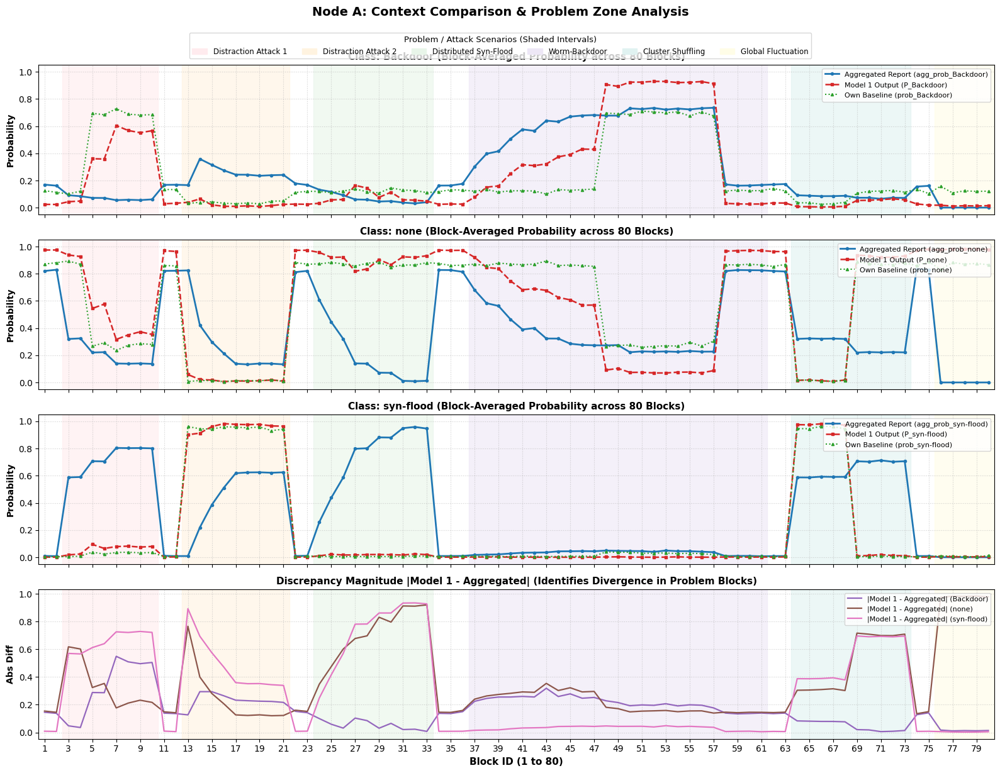

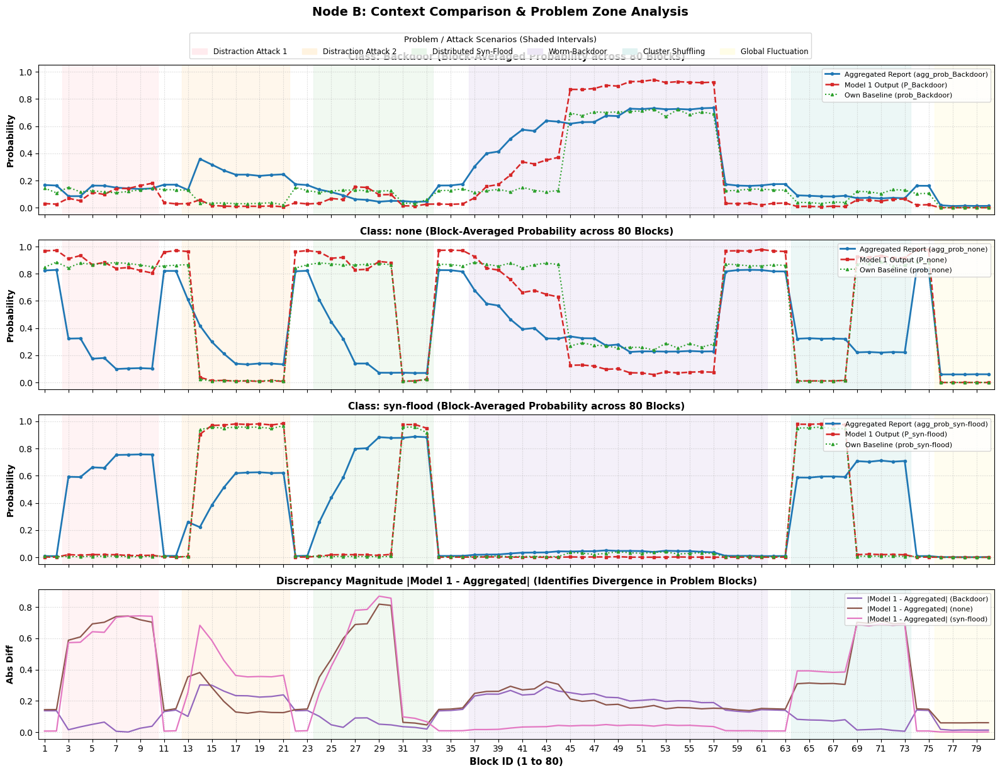

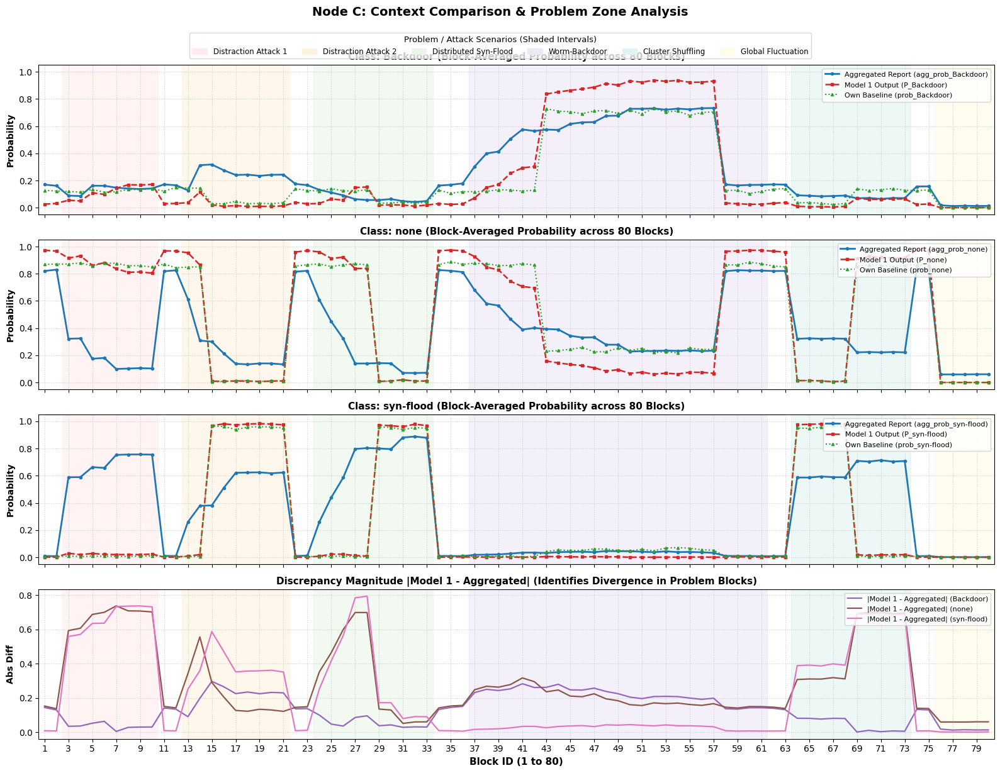

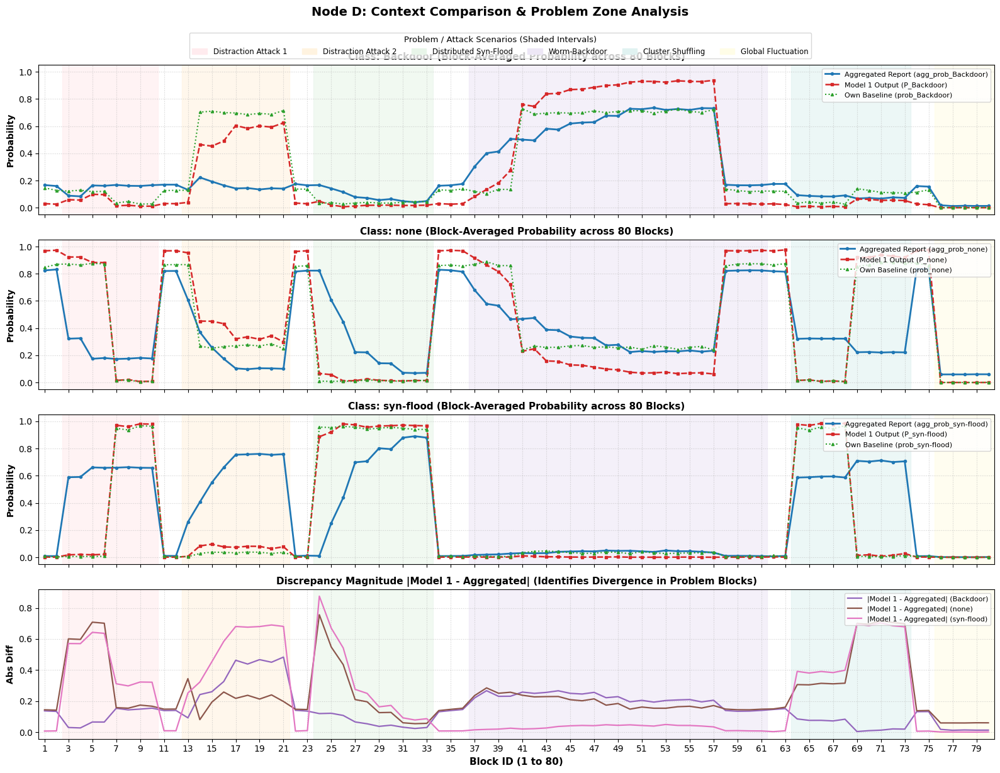

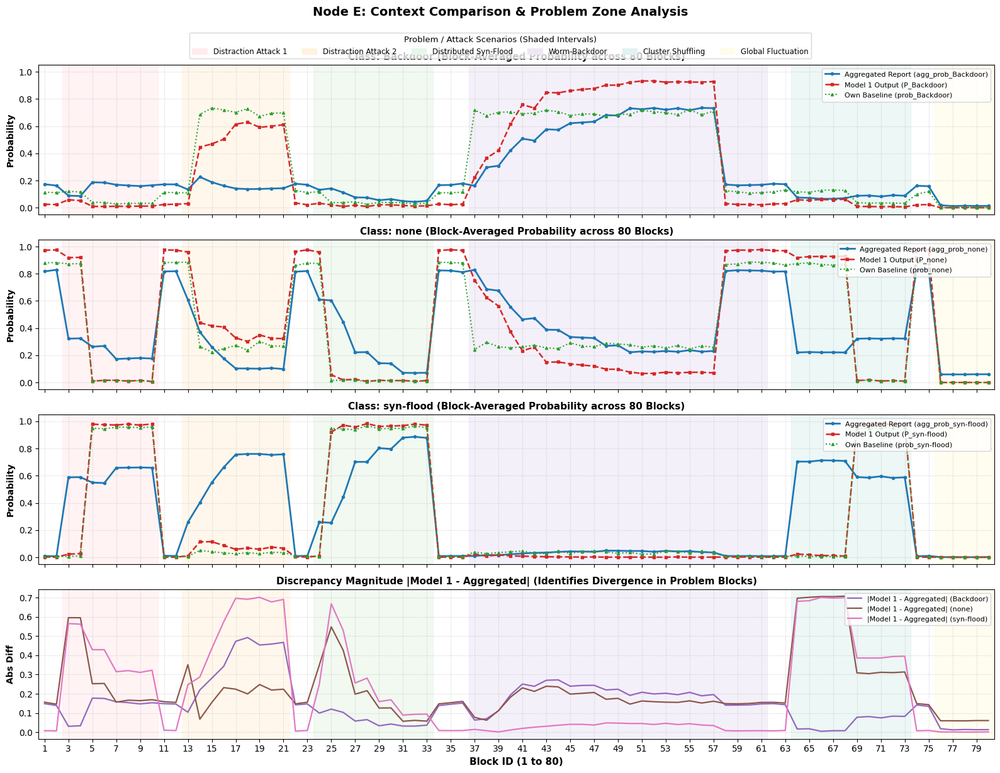

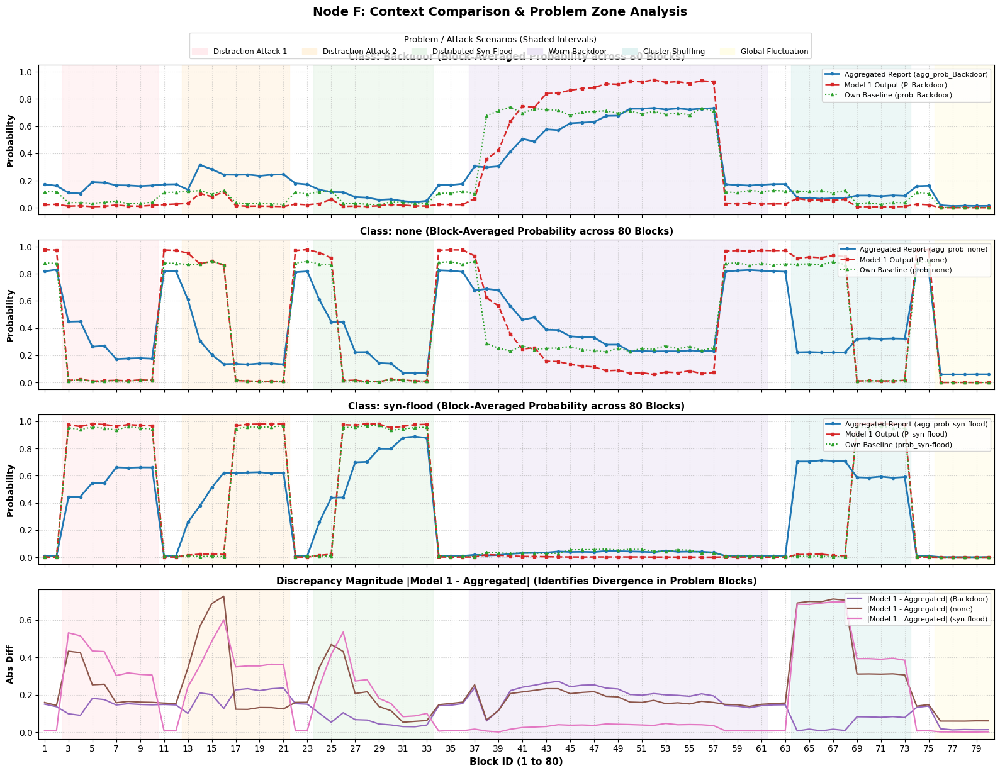

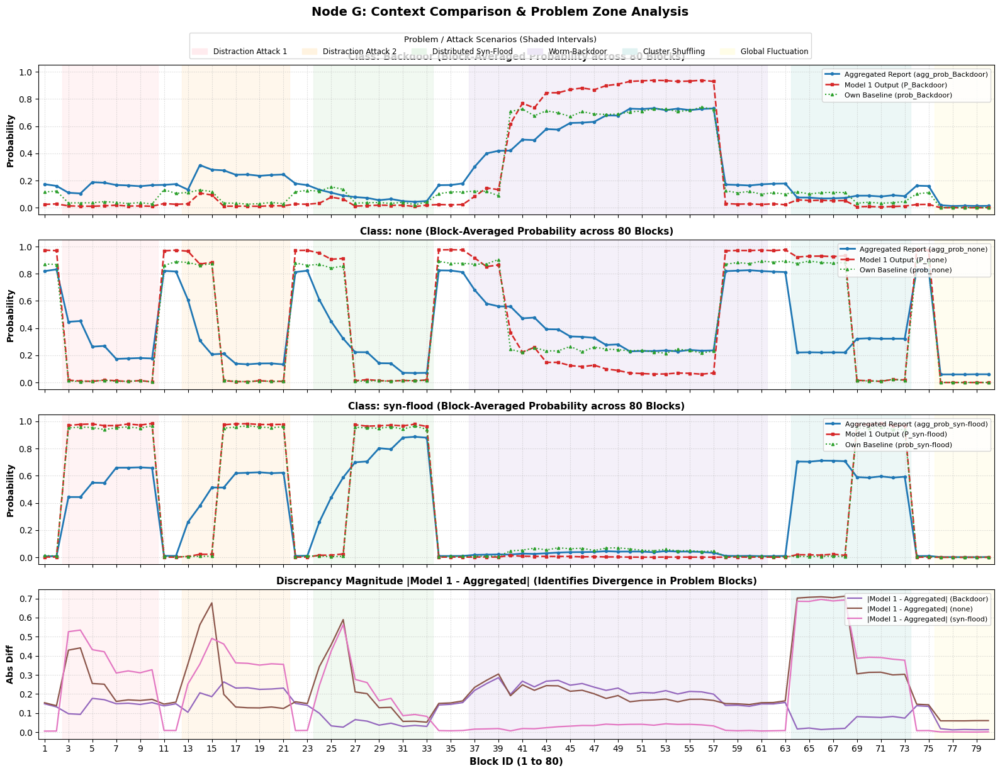

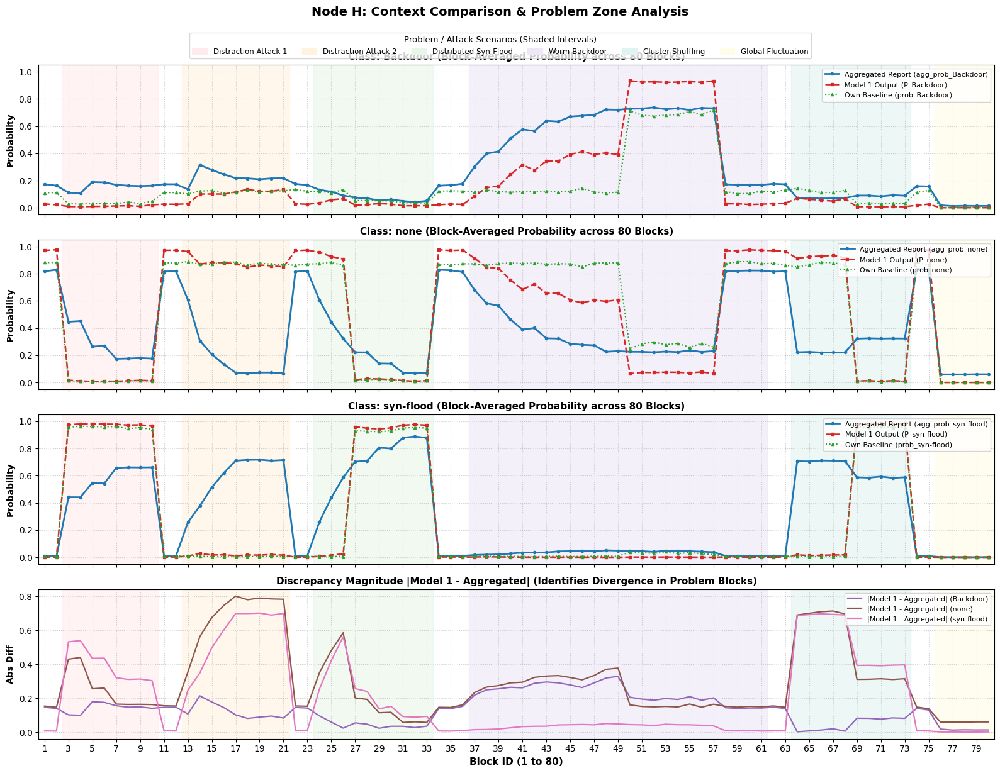

In [16]:
import os
import joblib
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# =============================================================================
# 1. Setup & Paths
# =============================================================================
MODELS_DIR = "models"
BASE_DIR = "dataset/normalized"
AUG_DIR = os.path.join(BASE_DIR, "augmented_csv")
NODES = ["A", "B", "C", "D", "E", "F", "G", "H"]
TOTAL_BLOCKS = 80

# Load model, scaler, and label encoder
le = joblib.load(os.path.join(MODELS_DIR, "label_encoder.joblib"))
classes = le.classes_
rf_m1_global = joblib.load(
    os.path.join(MODELS_DIR, "global_rf_model1_own_hw_plus_agg_state.joblib")
)
scaler_m1 = joblib.load(
    os.path.join(MODELS_DIR, "global_scaler_model1_state.joblib")
)

# Core attack scenarios (the "problem" blocks)
PROBLEM_SCENARIOS = {
    "Distraction Attack 1": (3, 10, "#ffebee"),
    "Distraction Attack 2": (13, 21, "#fff3e0"),
    "Distributed Syn-Flood": (24, 33, "#e8f5e9"),
    "Worm-Backdoor": (37, 61, "#ede7f6"),
    "Cluster Shuffling": (64, 73, "#e0f2f1"),
    "Global Fluctuation": (76, 80, "#fffde7"),
}
# Feature definitions for Model 1 (2:1 sampling)
original_numeric = ["shunt_voltage", "bus_voltage_V", "current_mA", "power_mW"]
local_features = original_numeric + ["State"]
agg_numeric = [f"agg_{f}" for f in original_numeric]
agg_prob_cols = [f"agg_prob_{cls_name}" for cls_name in classes]
feature_cols_hw_plus_agg = local_features + agg_numeric + agg_prob_cols

own_cols_m1 = [c for c in feature_cols_hw_plus_agg if not c.startswith("agg_")]
numeric_own_m1 = [c for c in own_cols_m1 if c in original_numeric]
numeric_all_m1 = numeric_own_m1 + [f"{c}_w2" for c in numeric_own_m1] + agg_numeric

target_classes = ["Backdoor", "none", "syn-flood"]
state_mapping = {"idle": 0, "charging": 1}

# =============================================================================
# 2. Block-Level Inference and Problem-Focused Plotting
# =============================================================================
for node in NODES:
    csv_file = os.path.join(AUG_DIR, f"Node_{node}_combined_augmented_test.csv")
    df = pd.read_csv(csv_file)

    # Encode binary state and assign block IDs (1 to 80)
    if df["State"].dtype == object or isinstance(df["State"].iloc[0], str):
        df["State"] = df["State"].map(state_mapping).fillna(0).astype(int)

    n_rows = len(df)
    block_size = n_rows // TOTAL_BLOCKS
    df["block_id"] = np.clip(
        (np.arange(n_rows) // block_size) + 1, 1, TOTAL_BLOCKS
    )

    # Model 1 prediction
    X_m1 = df[feature_cols_hw_plus_agg].copy()
    for col in own_cols_m1:
        X_m1[f"{col}_w2"] = X_m1[col]

    X_m1[numeric_all_m1] = scaler_m1.transform(X_m1[numeric_all_m1])
    m1_probs = rf_m1_global.predict_proba(X_m1.to_numpy())

    for i, c in enumerate(classes):
        df[f"m1_prob_{c}"] = m1_probs[:, i]

    # Aggregate by block_id (averaging across the ~34 samples per block)
    cols_to_avg = (
        [f"agg_prob_{c}" for c in target_classes]
        + [f"prob_{c}" for c in target_classes]
        + [f"m1_prob_{c}" for c in target_classes]
    )
    df_blocks = df.groupby("block_id")[cols_to_avg].mean().reset_index()

    # Create figure: 3 target classes + 1 discrepancy/error summary panel
    fig, axes = plt.subplots(4, 1, figsize=(16, 12), sharex=True)
    block_x = df_blocks["block_id"].values

    for idx, cls_name in enumerate(target_classes):
        ax = axes[idx]

        # Plot 3 aggregated lines (80 points each)
        ax.plot(
            block_x,
            df_blocks[f"agg_prob_{cls_name}"],
            label=f"Aggregated Report (agg_prob_{cls_name})",
            color="#1f77b4",
            linewidth=2.0,
            marker="o",
            markersize=3,
        )
        ax.plot(
            block_x,
            df_blocks[f"m1_prob_{cls_name}"],
            label=f"Model 1 Output (P_{cls_name})",
            color="#d62728",
            linewidth=1.8,
            linestyle="--",
            marker="s",
            markersize=3,
        )
        ax.plot(
            block_x,
            df_blocks[f"prob_{cls_name}"],
            label=f"Own Baseline (prob_{cls_name})",
            color="#2ca02c",
            linewidth=1.5,
            linestyle=":",
            marker="^",
            markersize=3,
        )

        # Highlight problem scenario intervals
        for scen_name, (start_b, end_b, color) in PROBLEM_SCENARIOS.items():
            ax.axvspan(start_b - 0.5, end_b + 0.5, color=color, alpha=0.6, zorder=0)

        ax.set_ylabel("Probability", fontsize=10, fontweight="bold")
        ax.set_title(
            f"Class: {cls_name} (Block-Averaged Probability across 80 Blocks)",
            fontsize=11,
            fontweight="bold",
        )
        ax.set_ylim(-0.05, 1.05)
        ax.grid(True, linestyle=":", alpha=0.6)
        ax.legend(loc="upper right", fontsize=8, frameon=True)

    # 4th panel: Prediction Discrepancy / Problem Indicator (|Model 1 - Aggregated|)
    ax_err = axes[3]
    for cls_name, color in zip(
        target_classes, ["#9467bd", "#8c564b", "#e377c2"]
    ):
        diff_agg = np.abs(
            df_blocks[f"m1_prob_{cls_name}"] - df_blocks[f"agg_prob_{cls_name}"]
        )
        ax_err.plot(
            block_x,
            diff_agg,
            label=f"|Model 1 - Aggregated| ({cls_name})",
            color=color,
            linewidth=1.6,
        )

    for scen_name, (start_b, end_b, color) in PROBLEM_SCENARIOS.items():
        ax_err.axvspan(start_b - 0.5, end_b + 0.5, color=color, alpha=0.6, zorder=0)

    ax_err.set_title(
        "Discrepancy Magnitude |Model 1 - Aggregated| (Identifies Divergence in Problem Blocks)",
        fontsize=11,
        fontweight="bold",
    )
    ax_err.set_ylabel("Abs Diff", fontsize=10, fontweight="bold")
    ax_err.set_xlabel("Block ID (1 to 80)", fontsize=11, fontweight="bold")
    ax_err.set_xlim(0.5, 80.5)
    ax_err.set_xticks(np.arange(1, 81, 2))
    ax_err.grid(True, linestyle=":", alpha=0.6)
    ax_err.legend(loc="upper right", fontsize=8, frameon=True)

    # Legend for scenario shading
    scenario_patches = [
        mpatches.Patch(color=c, label=s)
        for s, (_, _, c) in PROBLEM_SCENARIOS.items()
    ]
    fig.legend(
        handles=scenario_patches,
        loc="upper center",
        bbox_to_anchor=(0.5, 0.99),
        ncol=6,
        fontsize=8.5,
        title="Problem / Attack Scenarios (Shaded Intervals)",
        title_fontsize=9.5,
    )

    plt.suptitle(
        f"Node {node}: Context Comparison & Problem Zone Analysis",
        fontsize=14,
        fontweight="bold",
        y=1.02,
    )
    plt.tight_layout()
    plt.show()

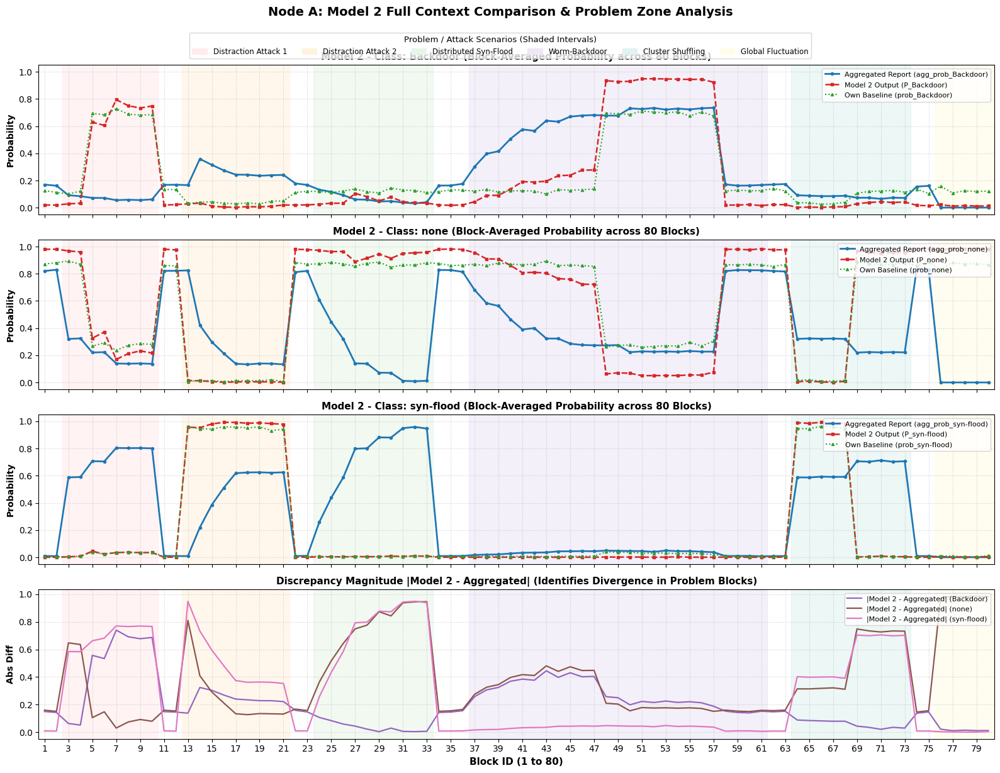

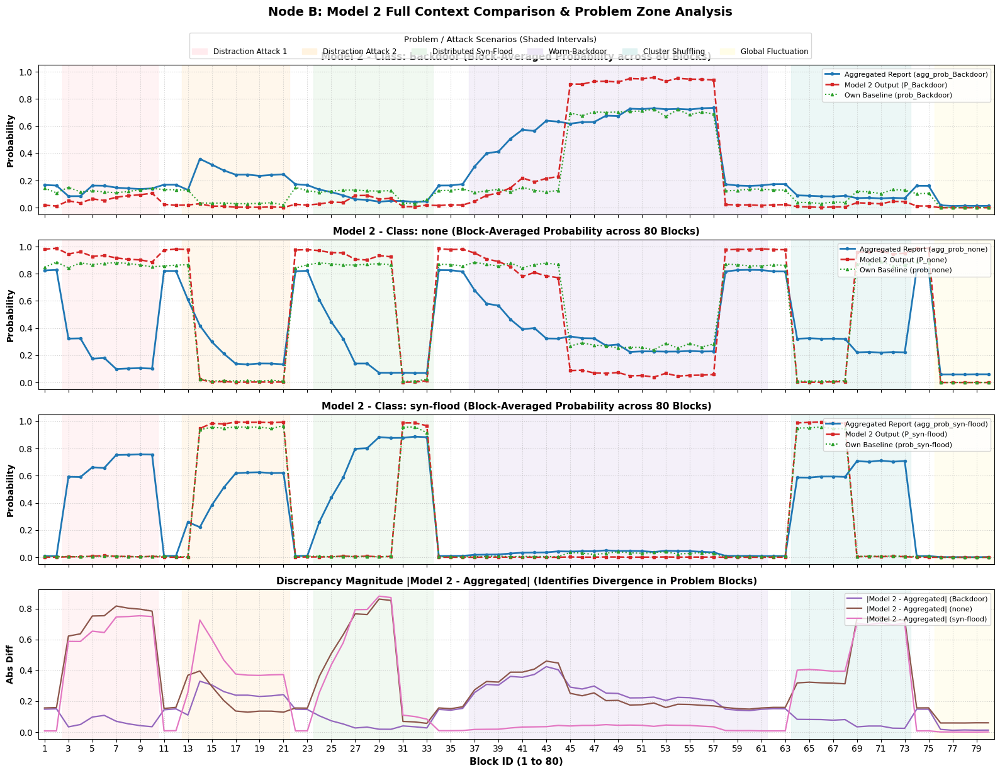

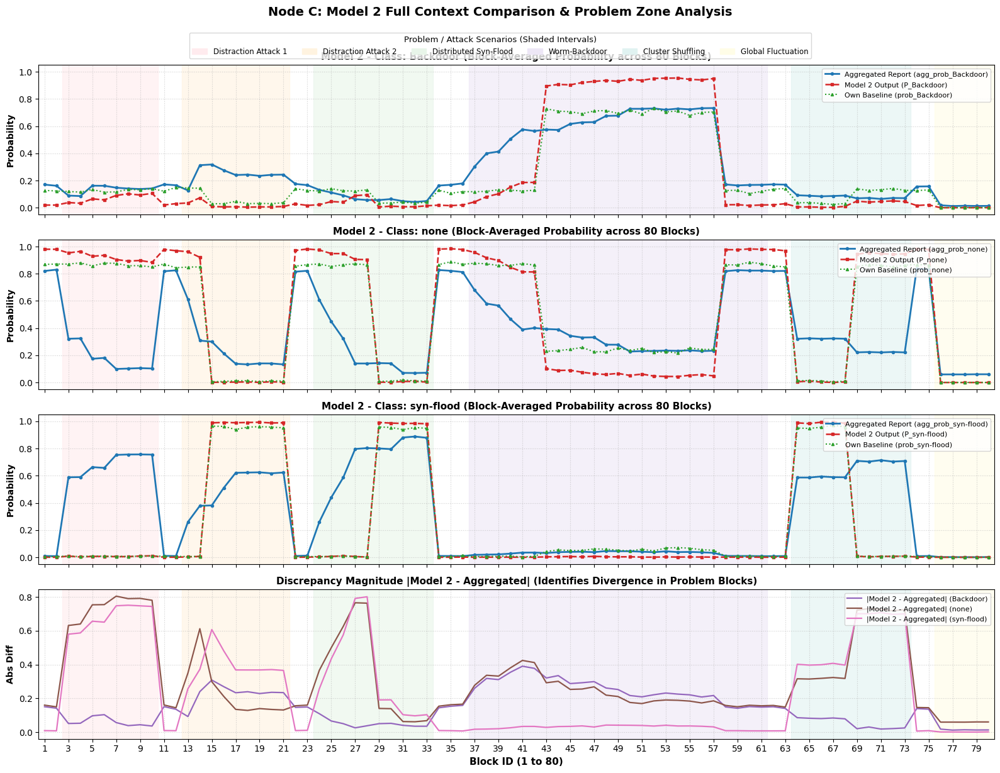

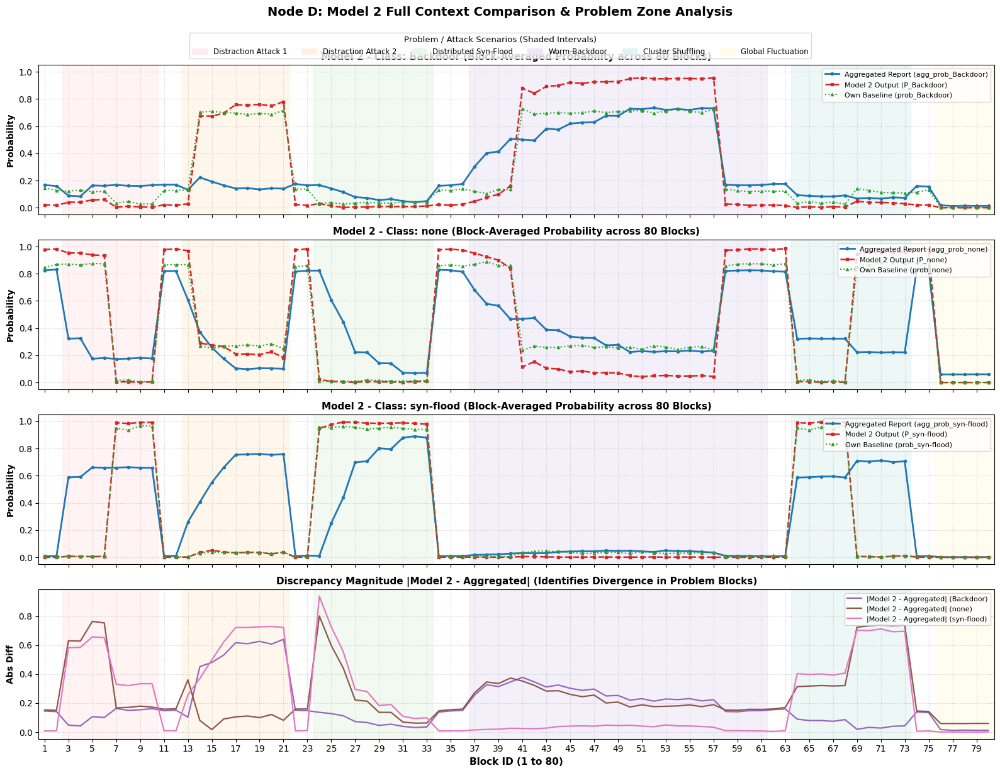

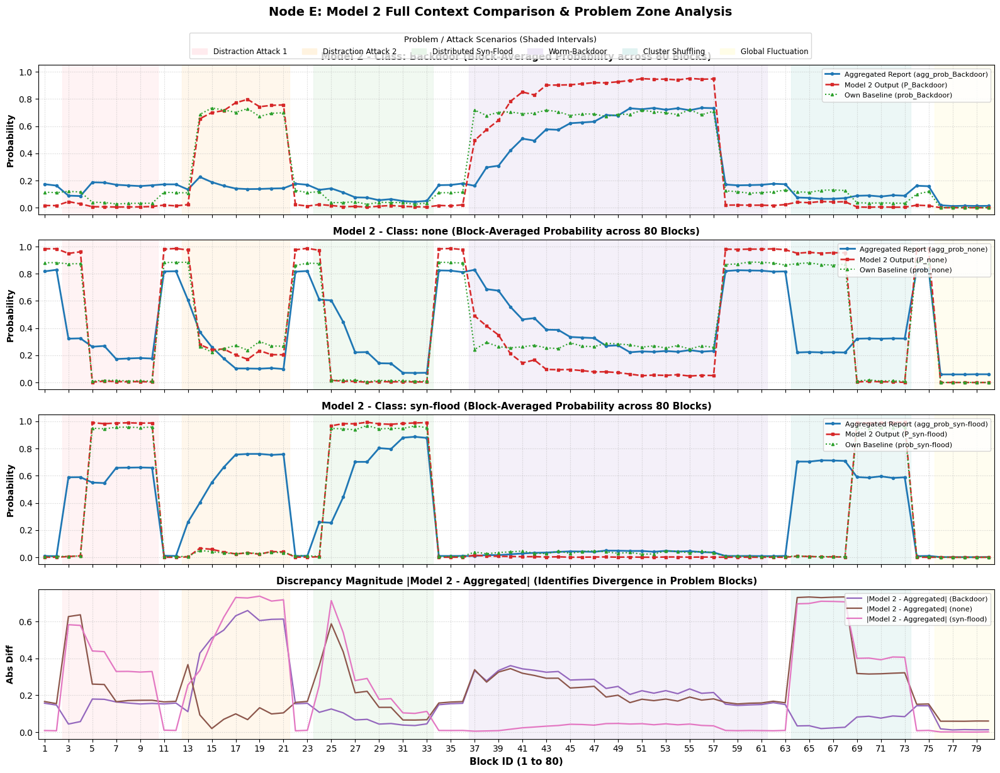

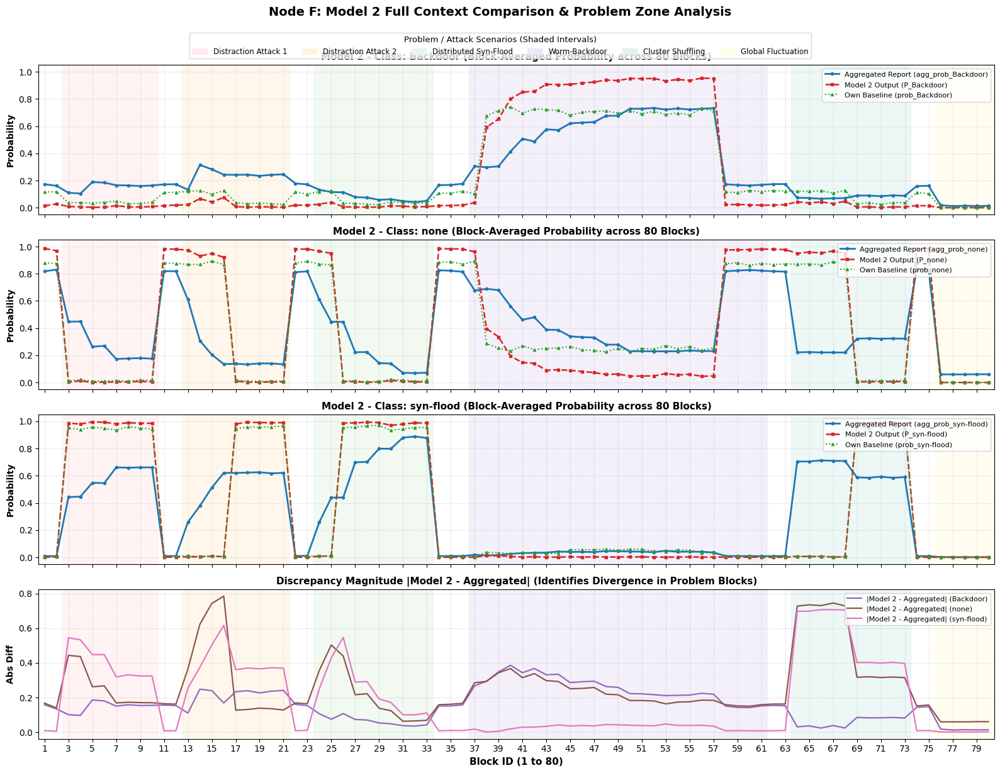

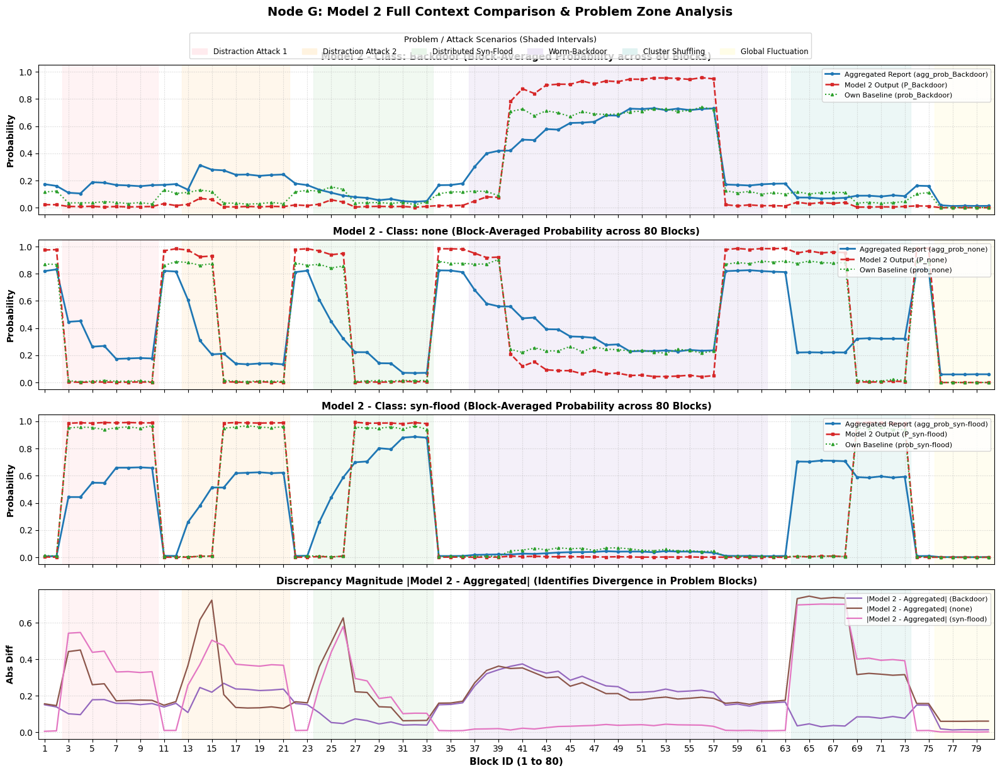

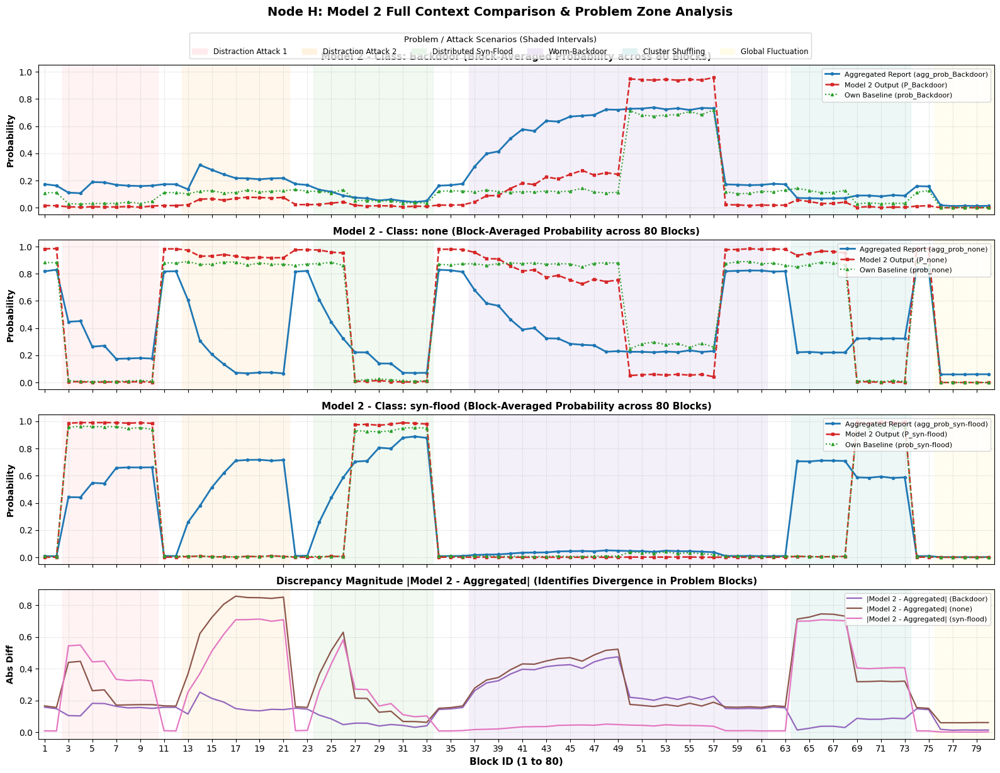

In [18]:
import os
import joblib
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# =============================================================================
# 1. Setup & Paths (Model 2)
# =============================================================================
MODELS_DIR = "models"
BASE_DIR = "dataset/normalized"
AUG_DIR = os.path.join(BASE_DIR, "augmented_csv")
NODES = ["A", "B", "C", "D", "E", "F", "G", "H"]
TOTAL_BLOCKS = 80

# Load model, scaler, and label encoder for Model 2
le = joblib.load(os.path.join(MODELS_DIR, "label_encoder.joblib"))
classes = le.classes_
rf_m2_global = joblib.load(
    os.path.join(MODELS_DIR, "global_rf_model2_full_context_state.joblib")
)
scaler_m2 = joblib.load(
    os.path.join(MODELS_DIR, "global_scaler_model2_state.joblib")
)

# Core attack scenarios (the "problem" blocks)
PROBLEM_SCENARIOS = {
    "Distraction Attack 1": (3, 10, "#ffebee"),
    "Distraction Attack 2": (13, 21, "#fff3e0"),
    "Distributed Syn-Flood": (24, 33, "#e8f5e9"),
    "Worm-Backdoor": (37, 61, "#ede7f6"),
    "Cluster Shuffling": (64, 73, "#e0f2f1"),
    "Global Fluctuation": (76, 80, "#fffde7"),
}

# Feature definitions for Model 2 (Full Context with 2:1 sampling)
original_numeric = ["shunt_voltage", "bus_voltage_V", "current_mA", "power_mW"]
local_features = original_numeric + ["State"]
own_prob_cols = [f"prob_{cls_name}" for cls_name in classes]
agg_numeric = [f"agg_{f}" for f in original_numeric]
agg_prob_cols = [f"agg_prob_{cls_name}" for cls_name in classes]

feature_cols_full = local_features + own_prob_cols + agg_numeric + agg_prob_cols

own_cols_m2 = [c for c in feature_cols_full if not c.startswith("agg_")]
numeric_own_m2 = [c for c in own_cols_m2 if c in original_numeric]
numeric_all_m2 = numeric_own_m2 + [f"{c}_w2" for c in numeric_own_m2] + agg_numeric

target_classes = ["Backdoor", "none", "syn-flood"]
state_mapping = {"idle": 0, "charging": 1}

# =============================================================================
# 2. Block-Level Inference and Problem-Focused Plotting (Model 2)
# =============================================================================
for node in NODES:
    csv_file = os.path.join(AUG_DIR, f"Node_{node}_combined_augmented_test.csv")
    df = pd.read_csv(csv_file)

    # Encode binary state and assign block IDs (1 to 80)
    if df["State"].dtype == object or isinstance(df["State"].iloc[0], str):
        df["State"] = df["State"].map(state_mapping).fillna(0).astype(int)

    n_rows = len(df)
    block_size = n_rows // TOTAL_BLOCKS
    df["block_id"] = np.clip(
        (np.arange(n_rows) // block_size) + 1, 1, TOTAL_BLOCKS
    )

    # Model 2 prediction
    X_m2 = df[feature_cols_full].copy()
    for col in own_cols_m2:
        X_m2[f"{col}_w2"] = X_m2[col]

    X_m2[numeric_all_m2] = scaler_m2.transform(X_m2[numeric_all_m2])
    m2_probs = rf_m2_global.predict_proba(X_m2.to_numpy())

    for i, c in enumerate(classes):
        df[f"m2_prob_{c}"] = m2_probs[:, i]

    # Aggregate by block_id (averaging across samples per block)
    cols_to_avg = (
        [f"agg_prob_{c}" for c in target_classes]
        + [f"prob_{c}" for c in target_classes]
        + [f"m2_prob_{c}" for c in target_classes]
    )
    df_blocks = df.groupby("block_id")[cols_to_avg].mean().reset_index()

    # Create figure: 3 target classes + 1 discrepancy/error summary panel
    fig, axes = plt.subplots(4, 1, figsize=(16, 12), sharex=True)
    block_x = df_blocks["block_id"].values

    for idx, cls_name in enumerate(target_classes):
        ax = axes[idx]

        # Plot aggregated lines
        ax.plot(
            block_x,
            df_blocks[f"agg_prob_{cls_name}"],
            label=f"Aggregated Report (agg_prob_{cls_name})",
            color="#1f77b4",
            linewidth=2.0,
            marker="o",
            markersize=3,
        )
        ax.plot(
            block_x,
            df_blocks[f"m2_prob_{cls_name}"],
            label=f"Model 2 Output (P_{cls_name})",
            color="#d62728",  # Grün für Model 2
            linewidth=1.8,
            linestyle="--",
            marker="s",
            markersize=3,
        )
        ax.plot(
            block_x,
            df_blocks[f"prob_{cls_name}"],
            label=f"Own Baseline (prob_{cls_name})",
            color="#2ca02c",
            linewidth=1.5,
            linestyle=":",
            marker="^",
            markersize=3,
        )

        # Highlight problem scenario intervals
        for scen_name, (start_b, end_b, color) in PROBLEM_SCENARIOS.items():
            ax.axvspan(start_b - 0.5, end_b + 0.5, color=color, alpha=0.6, zorder=0)

        ax.set_ylabel("Probability", fontsize=10, fontweight="bold")
        ax.set_title(
            f"Model 2 - Class: {cls_name} (Block-Averaged Probability across 80 Blocks)",
            fontsize=11,
            fontweight="bold",
        )
        ax.set_ylim(-0.05, 1.05)
        ax.grid(True, linestyle=":", alpha=0.6)
        ax.legend(loc="upper right", fontsize=8, frameon=True)

    # 4th panel: Prediction Discrepancy / Problem Indicator (|Model 2 - Aggregated|)
    ax_err = axes[3]
    for cls_name, color in zip(
        target_classes, ["#9467bd", "#8c564b", "#e377c2"]
    ):
        diff_agg = np.abs(
            df_blocks[f"m2_prob_{cls_name}"] - df_blocks[f"agg_prob_{cls_name}"]
        )
        ax_err.plot(
            block_x,
            diff_agg,
            label=f"|Model 2 - Aggregated| ({cls_name})",
            color=color,
            linewidth=1.6,
        )

    for scen_name, (start_b, end_b, color) in PROBLEM_SCENARIOS.items():
        ax_err.axvspan(start_b - 0.5, end_b + 0.5, color=color, alpha=0.6, zorder=0)

    ax_err.set_title(
        "Discrepancy Magnitude |Model 2 - Aggregated| (Identifies Divergence in Problem Blocks)",
        fontsize=11,
        fontweight="bold",
    )
    ax_err.set_ylabel("Abs Diff", fontsize=10, fontweight="bold")
    ax_err.set_xlabel("Block ID (1 to 80)", fontsize=11, fontweight="bold")
    ax_err.set_xlim(0.5, 80.5)
    ax_err.set_xticks(np.arange(1, 81, 2))
    ax_err.grid(True, linestyle=":", alpha=0.6)
    ax_err.legend(loc="upper right", fontsize=8, frameon=True)

    # Legend for scenario shading
    scenario_patches = [
        mpatches.Patch(color=c, label=s)
        for s, (_, _, c) in PROBLEM_SCENARIOS.items()
    ]
    fig.legend(
        handles=scenario_patches,
        loc="upper center",
        bbox_to_anchor=(0.5, 0.99),
        ncol=6,
        fontsize=8.5,
        title="Problem / Attack Scenarios (Shaded Intervals)",
        title_fontsize=9.5,
    )

    plt.suptitle(
        f"Node {node}: Model 2 Full Context Comparison & Problem Zone Analysis",
        fontsize=14,
        fontweight="bold",
        y=1.02,
    )
    plt.tight_layout()
    plt.show()

Performing PCA dimensionality reduction...
Running OPTICS clustering...
Saved cluster plot to 'plots/pca_optics_cluster_analysis.png'


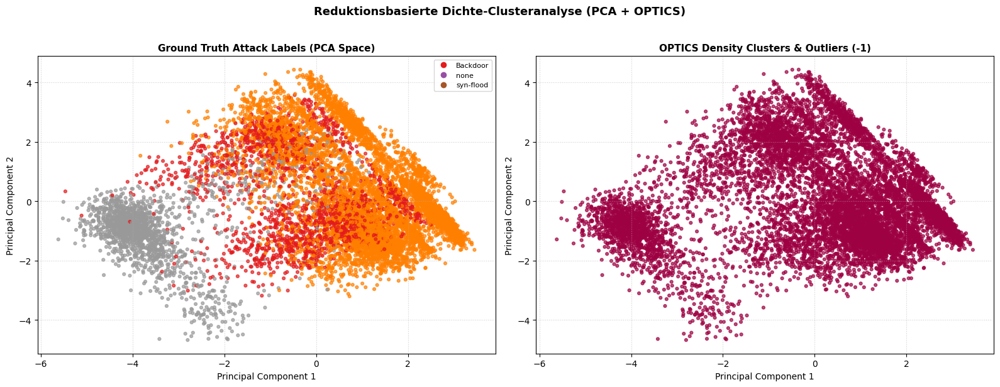

In [19]:
# Cell: Dimensionality Reduction (PCA) & Density-Based Clustering (OPTICS) Visualization

import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.cluster import OPTICS
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

PLOTS_DIR = "plots"
os.makedirs(PLOTS_DIR, exist_ok=True)

# 1. Select sample data (e.g., Test data from Node A, or a pooled subset for performance)
sample_df = aug_test["A"].sample(n=10000, random_state=42).copy() # Subsampling for speed if needed

# Define features used for clustering (Hardware metrics + Aggregated context)
clustering_features = [
    "shunt_voltage", "bus_voltage_V", "current_mA", "power_mW",
    "agg_shunt_voltage", "agg_bus_voltage_V", "agg_current_mA", "agg_power_mW"
]

X = sample_df[clustering_features].to_numpy()
y_true = sample_df["Attack"].values

# 2. Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 3. Dimensionality Reduction (PCA to 2D for visualization and stable clustering)
print("Performing PCA dimensionality reduction...")
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

# 4. Density-Based Clustering (OPTICS)
# OPTICS is ideal here because it generalizes DBSCAN and handles varying data densities well
print("Running OPTICS clustering...")
optics = OPTICS(min_samples=30, xi=0.05, min_cluster_size=0.03)
cluster_labels = optics.fit_predict(X_pca)

# 5. Plotting Side-by-Side: True Attack Classes vs. OPTICS Density Clusters
fig, axes = plt.subplots(1, 2, figsize=(16, 6), dpi=100)

# Subplot 1: Ground Truth Attack Classes
classes_unique = np.unique(y_true)
color_map = {cls: idx for idx, cls in enumerate(classes_unique)}
colors_true = [color_map[val] for val in y_true]

scatter1 = axes[0].scatter(
    X_pca[:, 0], X_pca[:, 1], 
    c=colors_true, cmap="Set1", s=12, alpha=0.7
)
axes[0].set_title("Ground Truth Attack Labels (PCA Space)", fontsize=11, fontweight="bold")
axes[0].set_xlabel("Principal Component 1", fontsize=10)
axes[0].set_ylabel("Principal Component 2", fontsize=10)
axes[0].grid(True, linestyle=":", alpha=0.6)

# Create legend for ground truth
handles1 = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=plt.cm.Set1(i/len(classes_unique)), label=cls, markersize=8) 
            for i, cls in enumerate(classes_unique)]
axes[0].legend(handles=handles1, loc="upper right", fontsize=8)

# Subplot 2: OPTICS Density-Based Clusters (-1 indicates noise/outliers)
scatter2 = axes[1].scatter(
    X_pca[:, 0], X_pca[:, 1], 
    c=cluster_labels, cmap="Spectral", s=12, alpha=0.7
)
axes[1].set_title("OPTICS Density Clusters & Outliers (-1)", fontsize=11, fontweight="bold")
axes[1].set_xlabel("Principal Component 1", fontsize=10)
axes[1].set_ylabel("Principal Component 2", fontsize=10)
axes[1].grid(True, linestyle=":", alpha=0.6)

plt.suptitle("Reduktionsbasierte Dichte-Clusteranalyse (PCA + OPTICS)", fontsize=13, fontweight="bold", y=1.02)
plt.tight_layout()

output_path = os.path.join(PLOTS_DIR, "pca_optics_cluster_analysis.png")
fig.savefig(output_path, dpi=300, bbox_inches="tight")
print(f"Saved cluster plot to '{output_path}'")

plt.show()
plt.close(fig)

In [20]:
paper = "Die PCA/OPTICS-Analyse separiert den Normalbetrieb (none) klar, zeigt jedoch Überlappungen zwischen Angriffen durch simultane Szenarien. Dies rechtfertigt den Einsatz der kollaborativen Kontextmodelle (Modell 1 & 2), welche diese Überlappungen präzise auflösen."
print(paper)

Die PCA/OPTICS-Analyse separiert den Normalbetrieb (none) klar, zeigt jedoch Überlappungen zwischen Angriffen durch simultane Szenarien. Dies rechtfertigt den Einsatz der kollaborativen Kontextmodelle (Modell 1 & 2), welche diese Überlappungen präzise auflösen.
